In [1]:
# for running in collab, sagemaker etc.
import sys
sys.path.insert(0, "/home/studio-lab-user/Generative_Models_for_CERN_Fast_Simulations/utils")

In [2]:
import tensorflow as tf; print(tf.config.list_physical_devices('GPU'))

2023-03-17 17:20:37.025011: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/nvidia/lib:/usr/local/nvidia/lib64
2023-03-17 17:20:37.025099: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/nvidia/lib:/usr/local/nvidia/lib64
2023-03-17 17:20:37.025109: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Cannot dlopen some TensorRT libraries. If you would like to use Nvidia GPU with TensorRT, please make sure the missing libraries mentioned above are installed properly.


[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn import datasets, linear_model, decomposition, manifold, preprocessing
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import RFE
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import precision_recall_curve, roc_curve, auc, accuracy_score, confusion_matrix
from sklearn.model_selection import StratifiedKFold, KFold, train_test_split
from tensorflow.keras import layers
import pickle
import time
from numpy import load
from matplotlib import pyplot
import pickle
import argparse

import tensorflow as tf
from tensorflow import keras
print(tf.__version__)

from tensorflow.compat.v1.keras.layers import Input, Dense, LeakyReLU, Conv2D, MaxPooling2D, UpSampling2D,  Concatenate
from tensorflow.compat.v1.keras.models import Model
from tensorflow.compat.v1.keras.layers import Dense, Reshape, Flatten
from tensorflow.compat.v1.keras.layers import Dropout,BatchNormalization
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.losses import mse, binary_crossentropy, logcosh
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.utils import plot_model
from tensorflow.keras import backend as K

import os
os.environ["CUDA_VISIBLE_DEVICES"] = "1"
os.environ['TF_CPP_MIN_LOG_LEVEL'] = "3"

from scipy.stats import wasserstein_distance
import pandas as pd
from utils import sum_channels_parallel
from sklearn.metrics import mean_absolute_error
from datetime import datetime

2.11.0


### Load and process data

In [4]:
import glob
import imageio
import matplotlib.pyplot as plt
import numpy as np
import os
import PIL
from tensorflow.keras import layers
import time

from IPython import display
import sklearn
from sklearn.preprocessing import StandardScaler
from datetime import datetime

In [5]:
data = pd.read_pickle('../../data/data_proton_photonsum_15_2133.pkl')
print('Loaded: ',  data.shape, "max:", data.max())

# Data containing particle conditional data from particle having responses with proton photon sum in interval [70, 2312] without taking into consideration photon sums of neutron responses.
data_cond = pd.read_pickle('../../data/data_cond_photonsum_15_2133_15_3273.pkl')
print('Loaded cond: ',  data_cond.shape, "max:",data_cond.values.max(), "min:",data_cond.values.min())

Loaded:  (48714, 56, 30) max: 678.0
Loaded cond:  (48714, 12) max: 7000.0 min: -7000.0


In [6]:
# calculate min max proton sum
photon_sum_proton_min, photon_sum_proton_max = data_cond.proton_photon_sum.min(), data_cond.proton_photon_sum.max()

In [7]:
data_cond.drop(columns=['proton_photon_sum', 'neutron_photon_sum', 'Pdg'], inplace=True)
data_cond.columns, len(data_cond.columns)

(Index(['Energy', 'Vx', 'Vy', 'Vz', 'Px', 'Py', 'Pz', 'mass', 'charge'], dtype='object'),
 9)

In [8]:
data_cond.head()

,Energy,Vx,Vy,Vz,Px,Py,Pz,mass,charge
0,3192.38,0.000000e+00,0.000000e+00,0.000000e+00,0.022422,-0.182957,-3192.38,939.565413,0.0
1,3961.55,0.000000e+00,0.000000e+00,0.000000e+00,-0.076487,0.179845,3961.55,938.272081,1.0
2,2770.10,1.861170e-17,2.517190e-17,-1.689330e-13,0.305187,0.412760,-2770.10,497.611000,0.0
3,3195.12,0.000000e+00,0.000000e+00,0.000000e+00,0.560528,-0.149980,3195.11,938.272081,1.0
4,1714.07,0.000000e+00,0.000000e+00,0.000000e+00,0.457768,0.145639,-1714.07,939.565413,0.0


In [9]:
DATE_STR = datetime.now().strftime("%d_%m_%Y_%H_%M")

NAME = "vae"

EXPERIMENT_DIR_NAME = f"{NAME}_{int(photon_sum_proton_min)}_{int(photon_sum_proton_max)}_{DATE_STR}"

print("Experiment DIR: ", EXPERIMENT_DIR_NAME)

Experiment DIR:  vae_15_2133_17_03_2023_17_20


In [10]:
def create_dir(path):
    isExist = os.path.exists(path)
    if not isExist:
        os.makedirs(path)

In [11]:
def save_scales(model_name, scaler_means, scaler_scales):
    out_fnm = f"{model_name}_scales.txt"
    res = "#means"
    for mean_ in scaler_means:
        res += "\n" + str(mean_)
    res += "\n\n#scales"
    for scale_ in scaler_scales:
        res += "\n" + str(scale_)

    filepath = f"../../models/{EXPERIMENT_DIR_NAME}/"
    create_dir(filepath)
    with open(filepath+out_fnm, mode="w") as f:
        f.write(res)

In [12]:
data = np.log(data+1)
data = np.float32(data)
print("data max", data.max(), "min", data.min())

data max 6.5206213 min 0.0


In [13]:
x_train, x_test, y_train, y_test, = train_test_split(data, data_cond, test_size=0.2, shuffle=False, random_state=42)
print(x_train.shape, x_test.shape, y_train.shape, y_test.shape)

(38971, 56, 30) (9743, 56, 30) (38971, 9) (9743, 9)


In [14]:
scaler = StandardScaler()
# scale cond datascaler = StandardScaler()
y_train = scaler.fit_transform(y_train)
y_test = scaler.transform(y_test)
print("cond max", y_train.max(), "min", y_train.min())

#save scales
save_scales("Proton", scaler.mean_, scaler.scale_)

cond max 22.267750474560664 min -37.89385322476621


In [15]:
# make tf datasets
dataset = tf.data.Dataset.from_tensor_slices(x_train).batch(batch_size=128)
dataset_cond = tf.data.Dataset.from_tensor_slices(y_train).batch(batch_size=128)
dataset_with_cond = tf.data.Dataset.zip((dataset,dataset_cond)).shuffle(12800)

val_dataset = tf.data.Dataset.from_tensor_slices(x_test).batch(batch_size=128)
val_dataset_cond = tf.data.Dataset.from_tensor_slices(y_test).batch(batch_size=128)
val_dataset_with_cond = tf.data.Dataset.zip((val_dataset,val_dataset_cond)).shuffle(12800)

### Define Model

In [16]:
############################ Define Models ############################
class Sampling(layers.Layer):
    """Uses (z_mean, z_log_var) to sample z, the vector encoding a digit."""

    def call(self, inputs):
        z_mean, z_log_var = inputs
        batch = tf.shape(z_mean)[0]
        dim = tf.shape(z_mean)[1]
        epsilon = tf.keras.backend.random_normal(shape=(batch, dim))
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon


latent_dim = 10
cond_dim = 9
poz_dim = 6


############################ encoder ############################

input_img = Input(shape=[56,30,1],name='input_img')
input_cond = Input(shape=cond_dim,name='input_cond')
x = Conv2D(32, kernel_size=4, strides=2, padding='same')(input_img)
x = Conv2D(64, kernel_size=4, strides=2,padding='same')(x)
x = Conv2D(128, kernel_size=4, strides=2,padding='same')(x)
x = LeakyReLU(alpha=0.1)(x)
x = Flatten()(x)
x = layers.concatenate([input_cond,x])
x = layers.Dense(latent_dim*2, activation="relu")(x)
z_mean = layers.Dense(latent_dim, name="z_mean")(x)
z_log_var = layers.Dense(latent_dim, name="z_log_var")(x)
z = Sampling()([z_mean, z_log_var])

encoder = keras.Model([input_img, input_cond], [z_mean, z_log_var, z], name="encoder")
encoder.summary()
############################ decoder ############################


x = Input(shape=(latent_dim,))
cond = Input(shape=(cond_dim,))
inputs = Concatenate(axis=1)([x, cond])

g = Dense(7*4*128)(inputs)
g = Reshape((7,4,128))(g)

g = UpSampling2D()(g)
g = Conv2D(128, kernel_size=4, padding='same')(g)
g = BatchNormalization()(g)
g = LeakyReLU(alpha=0)(g)

g = UpSampling2D()(g)
g = Conv2D(64, kernel_size=4, padding='same')(g)
g = BatchNormalization()(g)
g = LeakyReLU(alpha=0)(g)

g = UpSampling2D()(g)
g = Conv2D(32, kernel_size=4, padding='same')(g)
g = BatchNormalization()(g)
g = LeakyReLU(alpha=0)(g)

outputs = Conv2D(1, kernel_size=(1,3) ,activation='relu')(g)

generator = Model([x, cond], outputs, name='generator')
generator.summary()


# define losses
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
d_acc_r = keras.metrics.BinaryAccuracy(name="d_acc_r", threshold=0.5)
d_acc_f = keras.metrics.BinaryAccuracy(name="d_acc_r", threshold=0.5)
g_acc = keras.metrics.BinaryAccuracy(name="g_acc_g", threshold=0.5)

# define optimizer
vae_optimizer = tf.keras.optimizers.RMSprop(1e-4)

Model: "encoder"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_img (InputLayer)         [(None, 56, 30, 1)]  0           []                               
                                                                                                  
 conv2d (Conv2D)                (None, 28, 15, 32)   544         ['input_img[0][0]']              
                                                                                                  
 conv2d_1 (Conv2D)              (None, 14, 8, 64)    32832       ['conv2d[0][0]']                 
                                                                                                  
 conv2d_2 (Conv2D)              (None, 7, 4, 128)    131200      ['conv2d_1[0][0]']               
                                                                                            

In [17]:
#trainin params

EPOCHS = 100
noise_dim = 10
num_examples_to_generate = 16


START_GENERATING_IMG_FROM_IDX = 20
# Seed to reuse for generating samples for comparison during training
seed = tf.random.normal([num_examples_to_generate, noise_dim])
seed_cond = y_test[START_GENERATING_IMG_FROM_IDX:START_GENERATING_IMG_FROM_IDX+num_examples_to_generate]

### function to calculate ws distance between orginal and generated channels
org=np.exp(x_test)-1
ch_org = org.reshape(-1, 56,30)
ch_org = pd.DataFrame(sum_channels_parallel(ch_org)).values
del org

In [18]:
def calculate_ws_ch(n_calc):
    ws= [0,0,0,0,0]
    for j in range(n_calc):
        z = np.random.normal(0,1,(x_test.shape[0],10))
        z_c = y_test
        results = generator.predict([z,z_c])
        results = np.exp(results)-1
        try:
            ch_gen = np.array(results).reshape(-1,56,30)
            ch_gen = pd.DataFrame(sum_channels_parallel(ch_gen)).values
            for i in range(5):
                ws[i] = ws[i] + wasserstein_distance(ch_org[:,i], ch_gen[:,i])
            ws = np.array(ws)
        except ValueError as e:
            print(e)

    ws = ws/n_calc
    print("ws mean",f'{ws.sum()/5:.2f}', end=" ")
    for n, score in enumerate(ws):
        print("ch"+str(n+1),f'{score:.2f}',end=" ")



####################### training ##############################
@tf.function
def train_step(batch,step):

    images, cond = batch
    step=step
    BATCH_SIZE = tf.shape(images)[0]

    #train vae
    with tf.GradientTape() as tape:
        z_mean, z_log_var, z = encoder([images, cond])
        reconstruction = generator([z, cond])
        reconstruction_loss = tf.reduce_mean(
            tf.reduce_sum(
                keras.losses.mean_squared_error(tf.reshape(images,(-1,56,30,1)), reconstruction), axis=(1, 2)
            )
        )
        kl_loss = -0.5 * (1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var))
        kl_loss = tf.reduce_mean(tf.reduce_sum(kl_loss, axis=1))
        total_loss = 0.7 * kl_loss + reconstruction_loss
    grads = tape.gradient(total_loss, generator.trainable_weights+encoder.trainable_weights)
    vae_optimizer.apply_gradients(zip(grads, generator.trainable_weights+encoder.trainable_weights))

    return total_loss, reconstruction_loss, kl_loss

In [19]:
filepath_mod = f"../../models/{EXPERIMENT_DIR_NAME}/"
create_dir(filepath_mod)

history = []
history_loss = []
def train(dataset, epochs):
    tf_step = tf.Variable(0, dtype=float)
    step=0
    generate_and_save_images(generator,
                             epochs,
                             [seed, seed_cond])
    #print(calculate_ws_mae(3))
    for epoch in range(epochs):
        start = time.time()

        for batch in dataset:
            total_loss, reconstruction_loss, kl_loss =train_step(batch,tf_step)
            history.append([total_loss, reconstruction_loss, kl_loss])
            tf_step.assign_add(1)
            step = step+1

            if step%100==0:
                print("%d [Total loss: %.2f] [Recon_loss: %.2f] [KL loss: %.2f]"% (
                    step, total_loss, reconstruction_loss, kl_loss))

        generate_and_save_images(generator,
                                 epoch,
                                 [seed, seed_cond]
                                 )

        # Save the model every epoch
        encoder.compile()
        generator.compile()
        encoder.save(os.path.join(filepath_mod, "enc_"+NAME + "_"+ str(epoch) +".h5"))
        generator.save(os.path.join(filepath_mod, "gen_"+NAME + "_"+ str(epoch) +".h5"))
        np.savez(os.path.join(filepath_mod, "history_"+NAME+".npz"),
                 np.array(history))
        calculate_ws_ch(min(epoch//5+1, 5))

        print('Time for epoch {} is {} sec'.format(epoch + 1, time.time()-start))

    return history


filepath_img = f"../../images/{EXPERIMENT_DIR_NAME}/"
create_dir(filepath_img)

In [20]:
def generate_and_save_images(model, epoch, test_input):
    
    SUPTITLE_TXT = f"\nModel: VAE proton data" \
               f"\nPhotonsum interval: [{photon_sum_proton_min}, {photon_sum_proton_max}]" \
               f"\nEPOCH: {epoch}"
    # Notice `training` is set to False.
    # This is so all layers run in inference mode (batchnorm).
    predictions = model(test_input, training=False)  # returns 16 responses
    fig, axs = plt.subplots(2, 7, figsize=(15, 5))
    fig.suptitle(SUPTITLE_TXT, x=0.1, horizontalalignment='left')
    
    for i in range(0, 14):
        if i < 7:
            x = x_test[START_GENERATING_IMG_FROM_IDX+i].reshape(56, 30)
        else:
            x = predictions[i-7].numpy().reshape(56, 30)
        #x[x<=0]=x.max()*-0.1
        im = axs[i // 7, i % 7].imshow(x, cmap='gnuplot')
        axs[i // 7, i % 7].axis('off')
        fig.colorbar(im, ax=axs[i // 7, i % 7])

    fig.tight_layout(rect=[0, 0, 1, 0.975])
    plt.savefig(os.path.join(filepath_img, 'image_at_epoch_{:04d}.png'.format(epoch)))
    plt.show()

### Train model

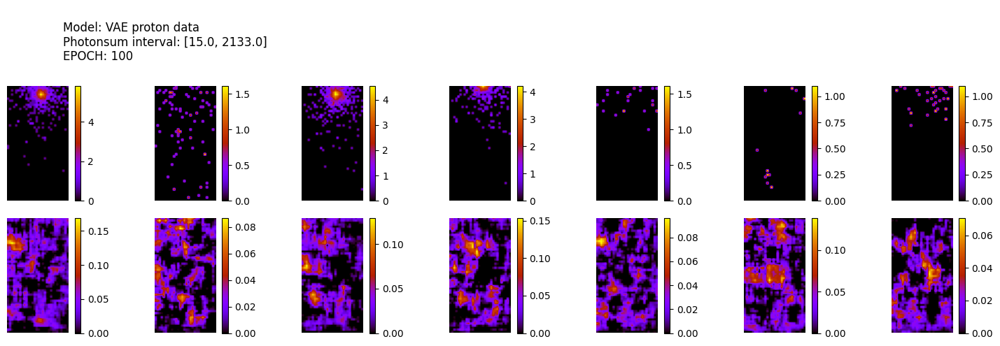

100 [Total loss: 50.43] [Recon_loss: 48.07] [KL loss: 3.36]
200 [Total loss: 51.81] [Recon_loss: 49.44] [KL loss: 3.39]
300 [Total loss: 48.64] [Recon_loss: 45.99] [KL loss: 3.79]


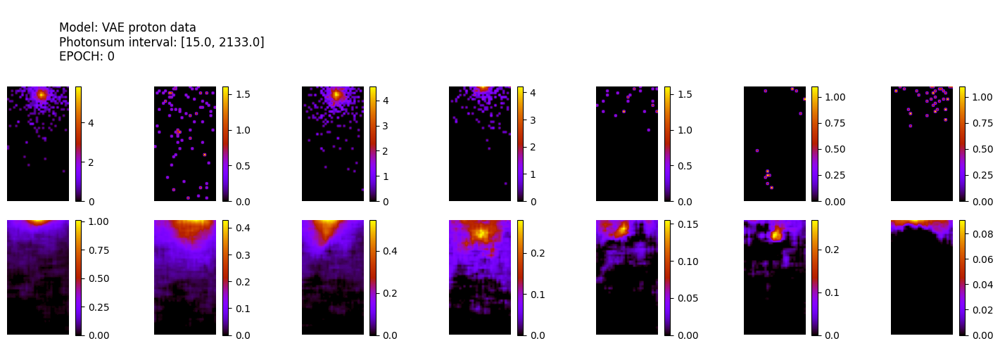

305/305 [==============================] - 2s 4ms/step
ws mean 39.51 ch1 0.02 ch2 7.13 ch3 0.33 ch4 91.48 ch5 98.60 Time for epoch 1 is 23.062489986419678 sec
400 [Total loss: 50.54] [Recon_loss: 47.89] [KL loss: 3.80]
500 [Total loss: 44.72] [Recon_loss: 42.46] [KL loss: 3.22]
600 [Total loss: 43.49] [Recon_loss: 41.18] [KL loss: 3.31]


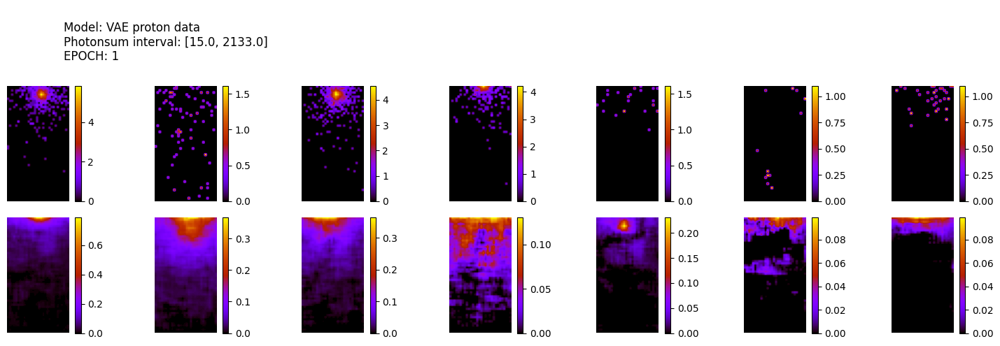

305/305 [==============================] - 1s 4ms/step
ws mean 41.58 ch1 0.03 ch2 8.48 ch3 0.35 ch4 95.27 ch5 103.79 Time for epoch 2 is 17.42024040222168 sec
700 [Total loss: 46.56] [Recon_loss: 44.52] [KL loss: 2.91]
800 [Total loss: 35.19] [Recon_loss: 33.48] [KL loss: 2.45]
900 [Total loss: 33.88] [Recon_loss: 32.46] [KL loss: 2.03]


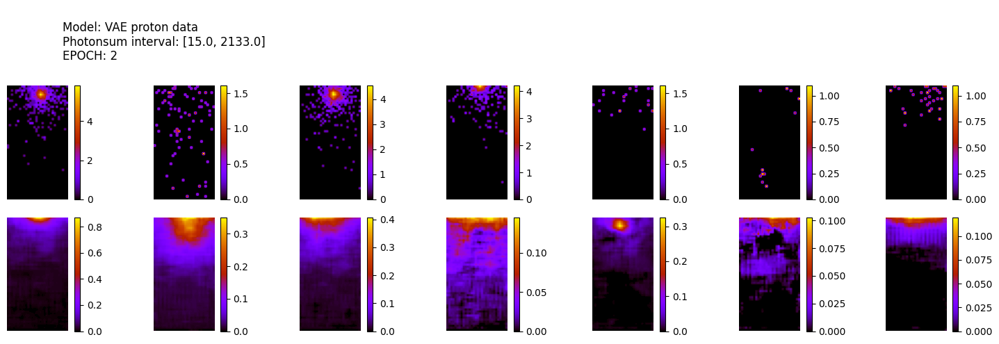

305/305 [==============================] - 1s 4ms/step
ws mean 37.97 ch1 0.02 ch2 6.52 ch3 0.33 ch4 88.28 ch5 94.72 Time for epoch 3 is 17.336673736572266 sec
1000 [Total loss: 38.10] [Recon_loss: 36.37] [KL loss: 2.47]
1100 [Total loss: 44.86] [Recon_loss: 43.18] [KL loss: 2.40]
1200 [Total loss: 47.13] [Recon_loss: 45.26] [KL loss: 2.67]


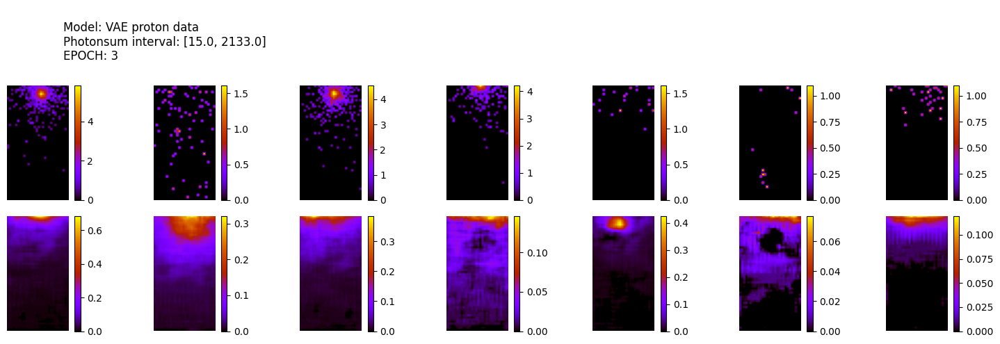

305/305 [==============================] - 1s 4ms/step
ws mean 39.56 ch1 0.02 ch2 7.33 ch3 0.34 ch4 91.40 ch5 98.72 Time for epoch 4 is 17.595353364944458 sec
1300 [Total loss: 36.86] [Recon_loss: 35.37] [KL loss: 2.12]
1400 [Total loss: 37.48] [Recon_loss: 36.04] [KL loss: 2.05]
1500 [Total loss: 39.44] [Recon_loss: 38.00] [KL loss: 2.05]


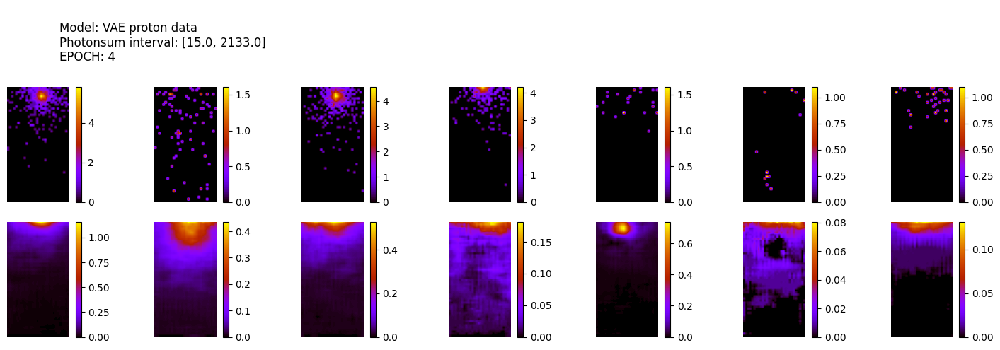

305/305 [==============================] - 1s 4ms/step
ws mean 35.42 ch1 0.02 ch2 6.20 ch3 0.34 ch4 82.22 ch5 88.31 Time for epoch 5 is 17.615251779556274 sec
1600 [Total loss: 39.11] [Recon_loss: 37.71] [KL loss: 2.00]
1700 [Total loss: 49.60] [Recon_loss: 47.56] [KL loss: 2.91]
1800 [Total loss: 47.63] [Recon_loss: 46.15] [KL loss: 2.12]


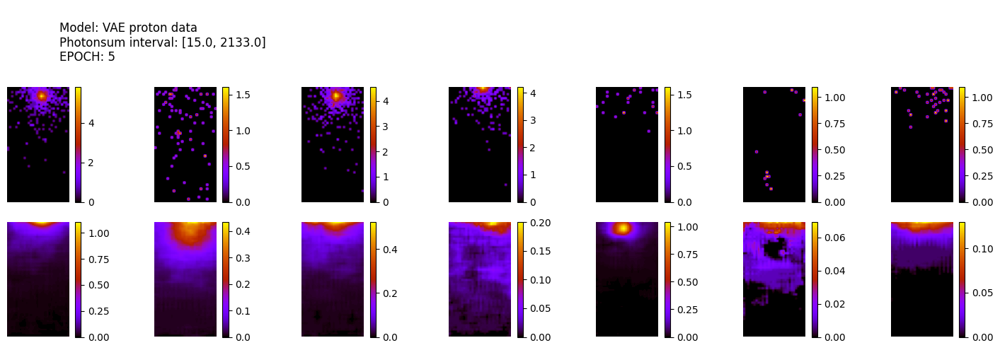

305/305 [==============================] - 1s 4ms/step
ws mean 34.03 ch1 0.01 ch2 6.18 ch3 0.31 ch4 78.53 ch5 85.09 Time for epoch 6 is 20.078489780426025 sec
1900 [Total loss: 37.25] [Recon_loss: 35.90] [KL loss: 1.93]
2000 [Total loss: 43.77] [Recon_loss: 42.32] [KL loss: 2.07]
2100 [Total loss: 41.74] [Recon_loss: 40.47] [KL loss: 1.82]


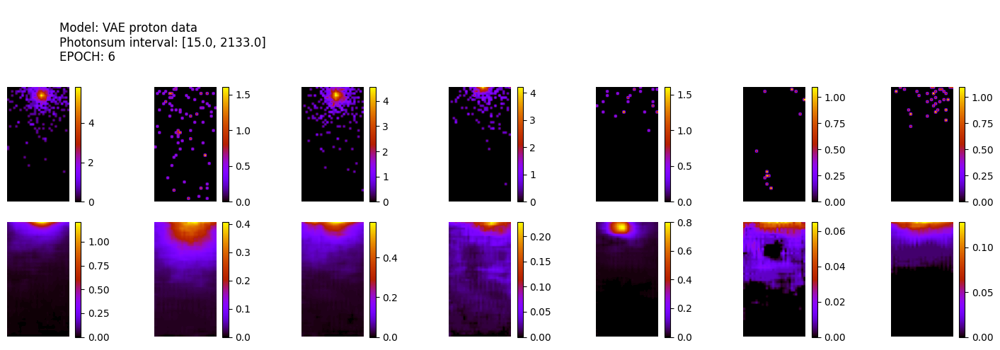

305/305 [==============================] - 1s 4ms/step
ws mean 35.97 ch1 0.02 ch2 6.84 ch3 0.29 ch4 83.00 ch5 89.72 Time for epoch 7 is 20.277960300445557 sec
2200 [Total loss: 46.82] [Recon_loss: 45.22] [KL loss: 2.30]
2300 [Total loss: 40.05] [Recon_loss: 38.74] [KL loss: 1.87]
2400 [Total loss: 35.92] [Recon_loss: 34.56] [KL loss: 1.94]


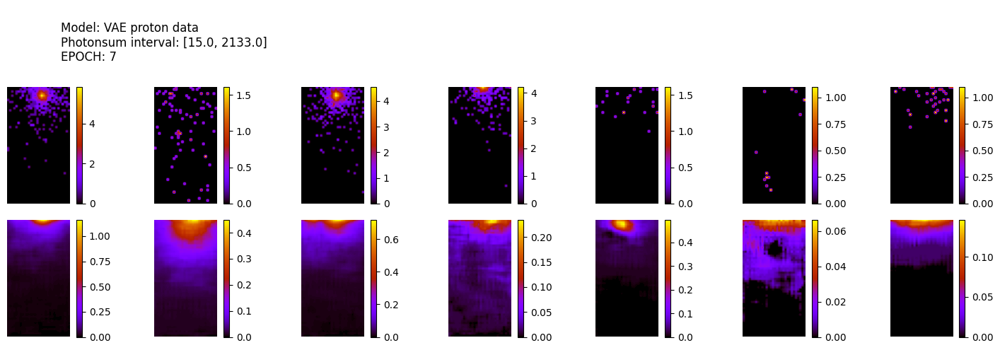

305/305 [==============================] - 1s 4ms/step
ws mean 32.77 ch1 0.02 ch2 5.95 ch3 0.29 ch4 75.85 ch5 81.72 Time for epoch 8 is 20.369673013687134 sec
2500 [Total loss: 42.90] [Recon_loss: 41.58] [KL loss: 1.89]
2600 [Total loss: 49.14] [Recon_loss: 47.41] [KL loss: 2.47]
2700 [Total loss: 45.24] [Recon_loss: 43.88] [KL loss: 1.94]


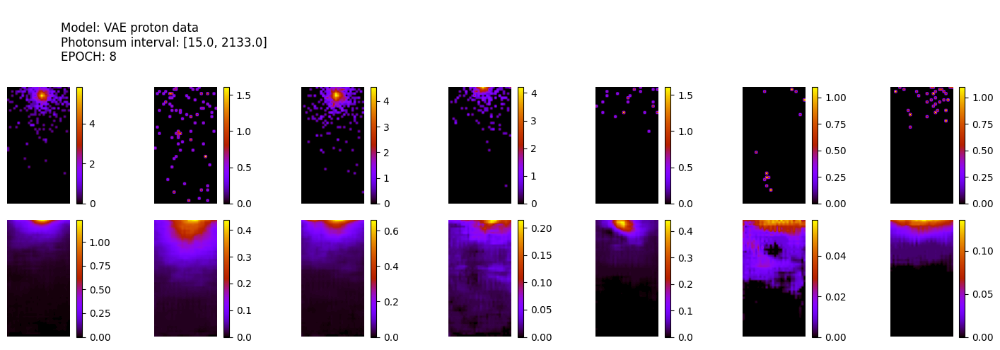

305/305 [==============================] - 1s 4ms/step
ws mean 34.97 ch1 0.02 ch2 6.94 ch3 0.29 ch4 80.40 ch5 87.19 Time for epoch 9 is 20.224020957946777 sec
2800 [Total loss: 51.16] [Recon_loss: 49.66] [KL loss: 2.13]
2900 [Total loss: 46.23] [Recon_loss: 44.73] [KL loss: 2.14]
3000 [Total loss: 37.80] [Recon_loss: 36.69] [KL loss: 1.58]


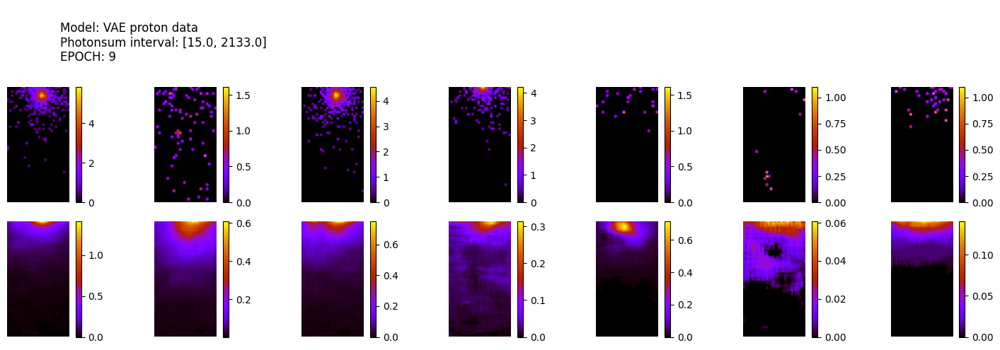

305/305 [==============================] - 1s 4ms/step
ws mean 30.25 ch1 0.02 ch2 5.77 ch3 0.27 ch4 69.53 ch5 75.67 Time for epoch 10 is 20.441617012023926 sec
3100 [Total loss: 39.95] [Recon_loss: 38.89] [KL loss: 1.51]
3200 [Total loss: 48.57] [Recon_loss: 46.81] [KL loss: 2.51]
3300 [Total loss: 40.00] [Recon_loss: 38.91] [KL loss: 1.56]


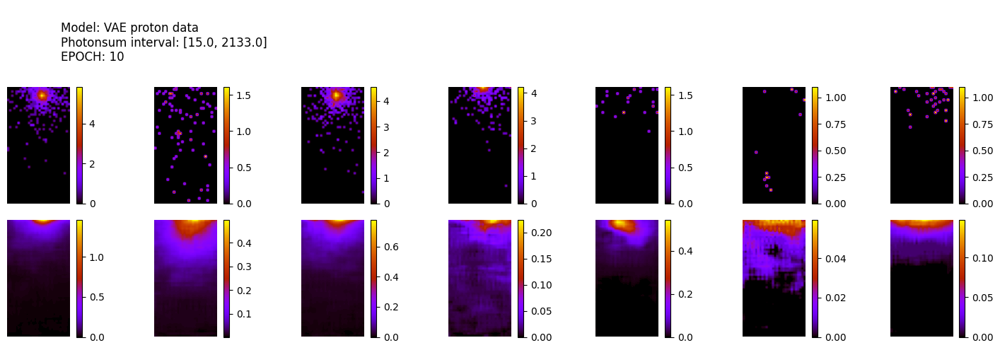

305/305 [==============================] - 1s 4ms/step
ws mean 32.24 ch1 0.02 ch2 6.08 ch3 0.30 ch4 74.43 ch5 80.36 Time for epoch 11 is 23.045426845550537 sec
3400 [Total loss: 45.26] [Recon_loss: 43.99] [KL loss: 1.81]
3500 [Total loss: 39.10] [Recon_loss: 38.03] [KL loss: 1.53]
3600 [Total loss: 41.28] [Recon_loss: 40.12] [KL loss: 1.65]


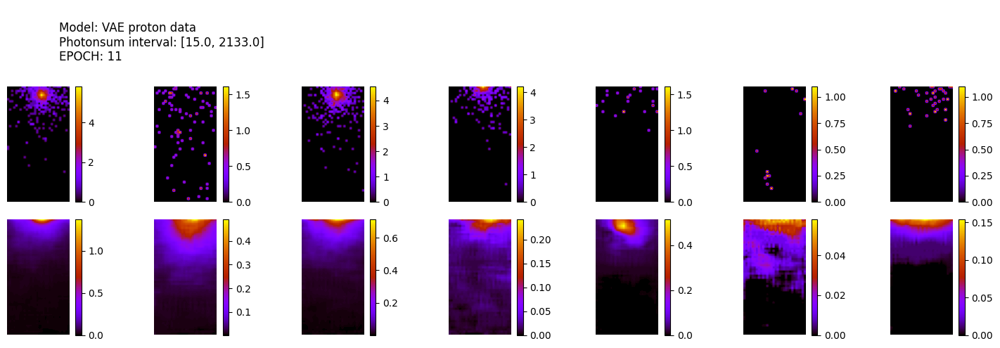

305/305 [==============================] - 1s 4ms/step
ws mean 33.95 ch1 0.02 ch2 6.54 ch3 0.27 ch4 78.30 ch5 84.62 Time for epoch 12 is 23.083205938339233 sec
3700 [Total loss: 41.98] [Recon_loss: 40.89] [KL loss: 1.54]
3800 [Total loss: 35.02] [Recon_loss: 34.11] [KL loss: 1.30]
3900 [Total loss: 44.17] [Recon_loss: 43.00] [KL loss: 1.67]


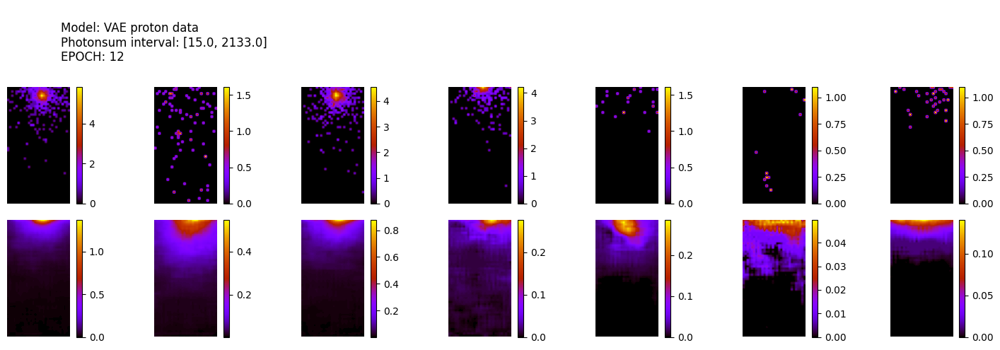

305/305 [==============================] - 1s 4ms/step
ws mean 31.99 ch1 0.02 ch2 6.63 ch3 0.29 ch4 73.19 ch5 79.82 Time for epoch 13 is 22.81070590019226 sec
4000 [Total loss: 40.89] [Recon_loss: 39.71] [KL loss: 1.68]
4100 [Total loss: 40.53] [Recon_loss: 39.39] [KL loss: 1.63]
4200 [Total loss: 42.38] [Recon_loss: 41.21] [KL loss: 1.67]


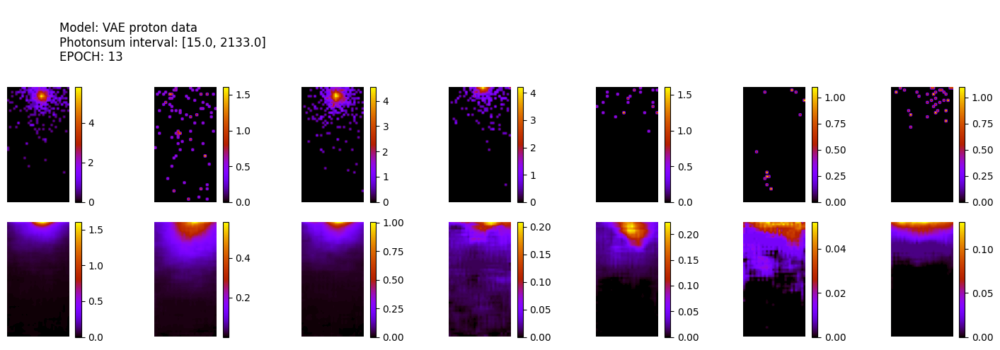

305/305 [==============================] - 1s 4ms/step
ws mean 31.31 ch1 0.02 ch2 6.58 ch3 0.31 ch4 71.53 ch5 78.10 Time for epoch 14 is 23.108880519866943 sec
4300 [Total loss: 42.48] [Recon_loss: 41.38] [KL loss: 1.57]
4400 [Total loss: 40.08] [Recon_loss: 39.14] [KL loss: 1.34]
4500 [Total loss: 41.40] [Recon_loss: 40.43] [KL loss: 1.39]


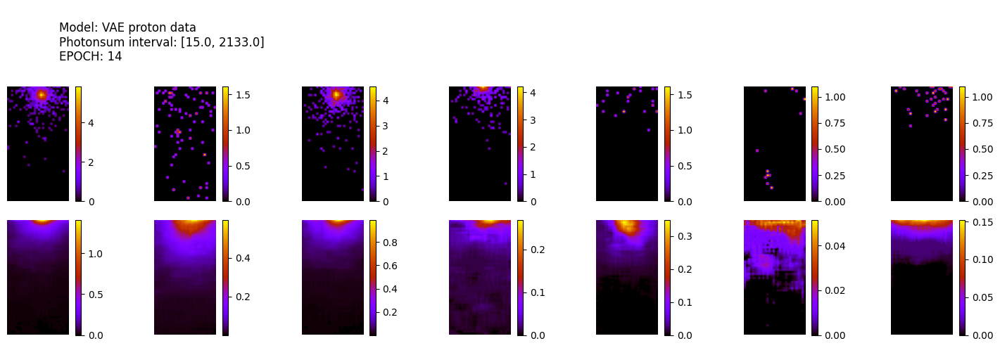

305/305 [==============================] - 1s 4ms/step
ws mean 30.49 ch1 0.02 ch2 6.24 ch3 0.30 ch4 69.74 ch5 76.16 Time for epoch 15 is 23.215250730514526 sec
4600 [Total loss: 32.83] [Recon_loss: 32.11] [KL loss: 1.03]
4700 [Total loss: 43.35] [Recon_loss: 42.29] [KL loss: 1.52]
4800 [Total loss: 42.13] [Recon_loss: 41.11] [KL loss: 1.45]


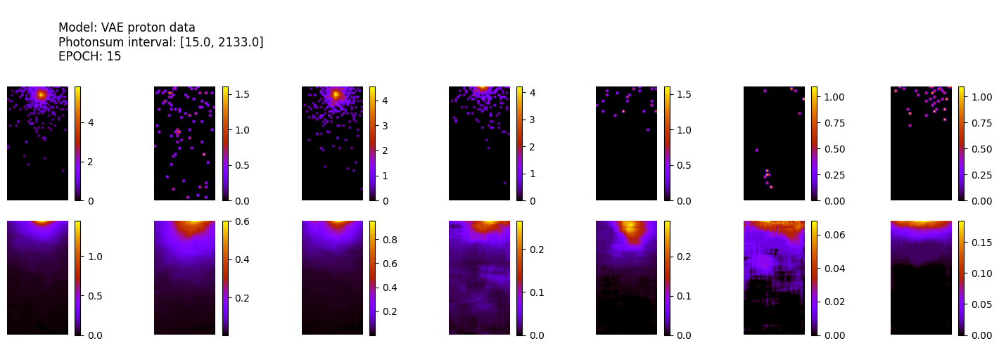

305/305 [==============================] - 1s 4ms/step
ws mean 30.12 ch1 0.02 ch2 4.92 ch3 0.30 ch4 70.17 ch5 75.19 Time for epoch 16 is 25.872435092926025 sec
4900 [Total loss: 38.40] [Recon_loss: 37.56] [KL loss: 1.20]
5000 [Total loss: 45.19] [Recon_loss: 44.03] [KL loss: 1.66]
5100 [Total loss: 45.31] [Recon_loss: 44.09] [KL loss: 1.74]


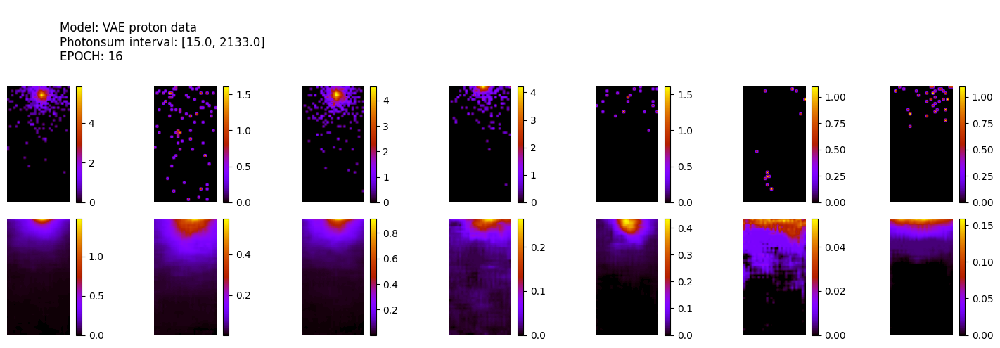

305/305 [==============================] - 1s 4ms/step
ws mean 29.98 ch1 0.02 ch2 5.60 ch3 0.27 ch4 69.30 ch5 74.70 Time for epoch 17 is 25.551170825958252 sec
5200 [Total loss: 41.77] [Recon_loss: 40.72] [KL loss: 1.50]
5300 [Total loss: 43.23] [Recon_loss: 42.12] [KL loss: 1.59]
5400 [Total loss: 44.68] [Recon_loss: 43.42] [KL loss: 1.79]


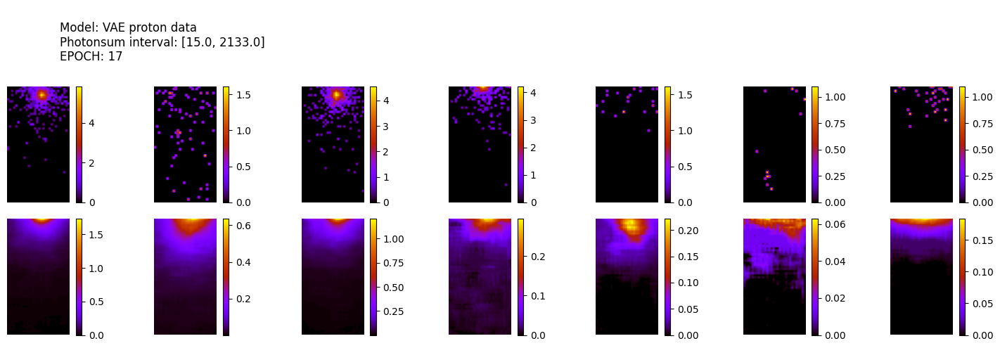

305/305 [==============================] - 1s 4ms/step
ws mean 28.88 ch1 0.02 ch2 5.77 ch3 0.28 ch4 66.31 ch5 72.02 Time for epoch 18 is 25.790037155151367 sec
5500 [Total loss: 44.52] [Recon_loss: 43.59] [KL loss: 1.32]
5600 [Total loss: 43.24] [Recon_loss: 42.14] [KL loss: 1.58]
5700 [Total loss: 39.36] [Recon_loss: 38.40] [KL loss: 1.37]


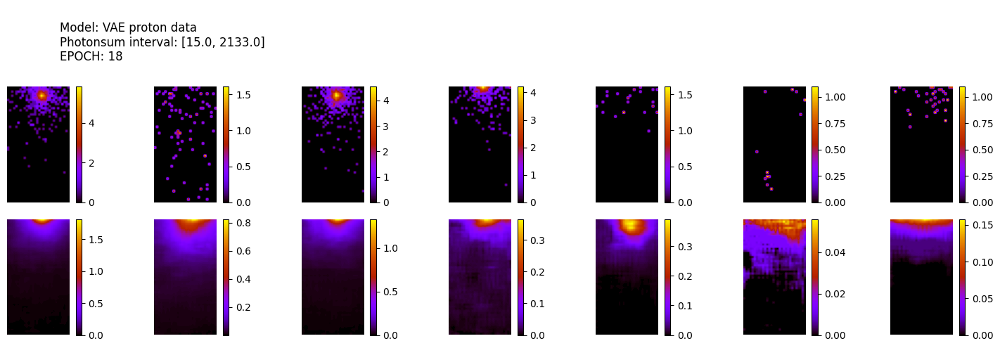

305/305 [==============================] - 1s 4ms/step
ws mean 27.78 ch1 0.02 ch2 6.06 ch3 0.26 ch4 63.33 ch5 69.22 Time for epoch 19 is 25.811425924301147 sec
5800 [Total loss: 44.63] [Recon_loss: 43.62] [KL loss: 1.44]
5900 [Total loss: 41.73] [Recon_loss: 40.75] [KL loss: 1.39]
6000 [Total loss: 34.58] [Recon_loss: 33.85] [KL loss: 1.04]
6100 [Total loss: 39.52] [Recon_loss: 38.58] [KL loss: 1.35]


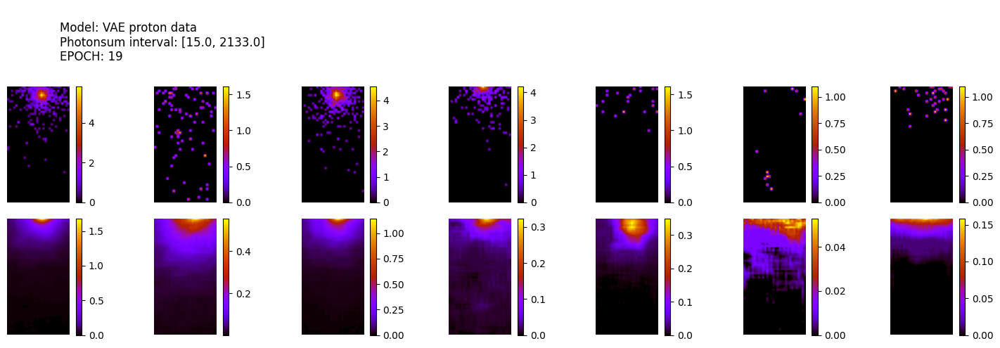

305/305 [==============================] - 1s 4ms/step
ws mean 32.95 ch1 0.02 ch2 6.87 ch3 0.29 ch4 75.45 ch5 82.12 Time for epoch 20 is 25.850152730941772 sec
6200 [Total loss: 42.80] [Recon_loss: 41.73] [KL loss: 1.52]
6300 [Total loss: 40.85] [Recon_loss: 40.07] [KL loss: 1.11]
6400 [Total loss: 44.45] [Recon_loss: 43.52] [KL loss: 1.34]


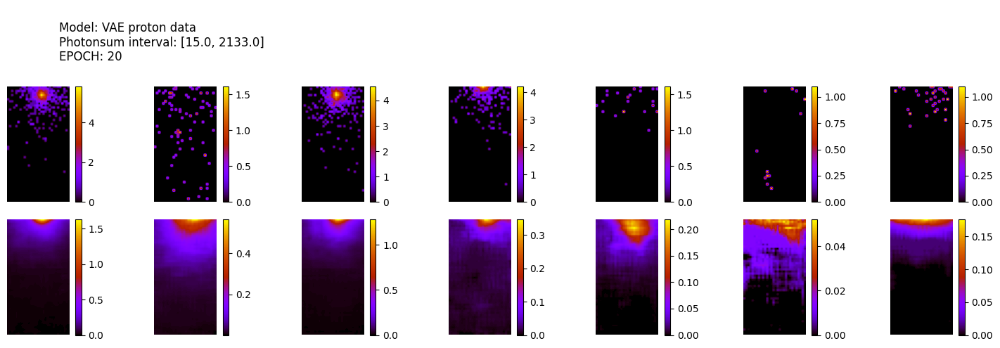

305/305 [==============================] - 1s 4ms/step
ws mean 31.36 ch1 0.02 ch2 6.47 ch3 0.26 ch4 71.87 ch5 78.19 Time for epoch 21 is 28.414637565612793 sec
6500 [Total loss: 45.73] [Recon_loss: 44.72] [KL loss: 1.45]
6600 [Total loss: 48.12] [Recon_loss: 46.95] [KL loss: 1.67]
6700 [Total loss: 46.98] [Recon_loss: 45.91] [KL loss: 1.53]


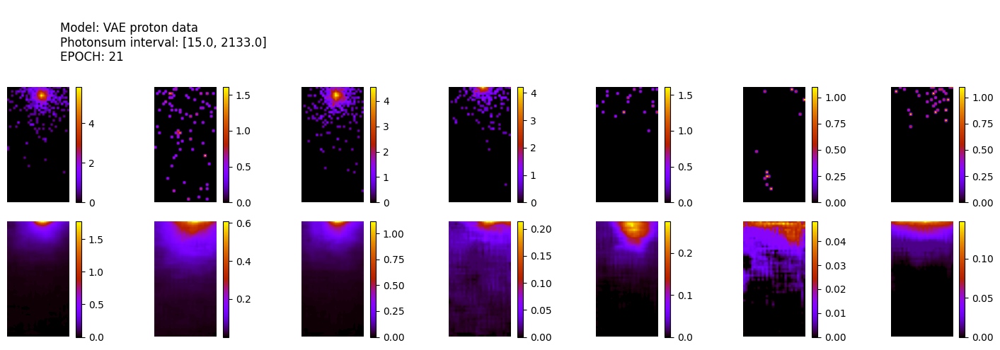

305/305 [==============================] - 1s 4ms/step
ws mean 32.22 ch1 0.02 ch2 6.97 ch3 0.29 ch4 73.51 ch5 80.29 Time for epoch 22 is 28.269810676574707 sec
6800 [Total loss: 46.30] [Recon_loss: 45.24] [KL loss: 1.51]
6900 [Total loss: 46.99] [Recon_loss: 45.94] [KL loss: 1.50]
7000 [Total loss: 41.48] [Recon_loss: 40.47] [KL loss: 1.44]


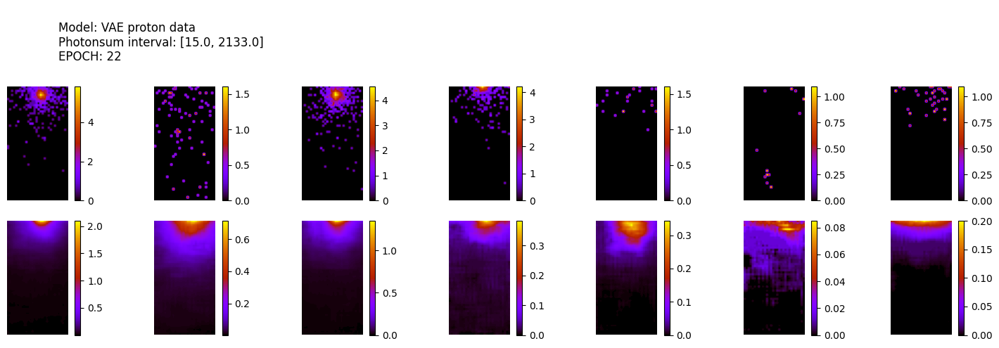

305/305 [==============================] - 1s 4ms/step
ws mean 26.15 ch1 0.02 ch2 5.71 ch3 0.26 ch4 59.61 ch5 65.16 Time for epoch 23 is 28.402039289474487 sec
7100 [Total loss: 37.85] [Recon_loss: 37.16] [KL loss: 0.98]
7200 [Total loss: 45.17] [Recon_loss: 44.20] [KL loss: 1.38]
7300 [Total loss: 33.30] [Recon_loss: 32.75] [KL loss: 0.78]


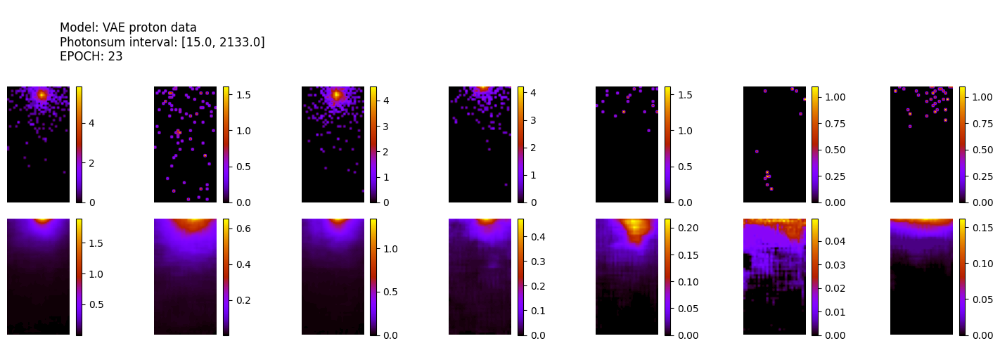

305/305 [==============================] - 1s 4ms/step
ws mean 29.01 ch1 0.02 ch2 5.98 ch3 0.28 ch4 66.42 ch5 72.37 Time for epoch 24 is 28.437397718429565 sec
7400 [Total loss: 42.43] [Recon_loss: 41.54] [KL loss: 1.28]
7500 [Total loss: 35.71] [Recon_loss: 34.92] [KL loss: 1.13]
7600 [Total loss: 50.33] [Recon_loss: 49.17] [KL loss: 1.67]


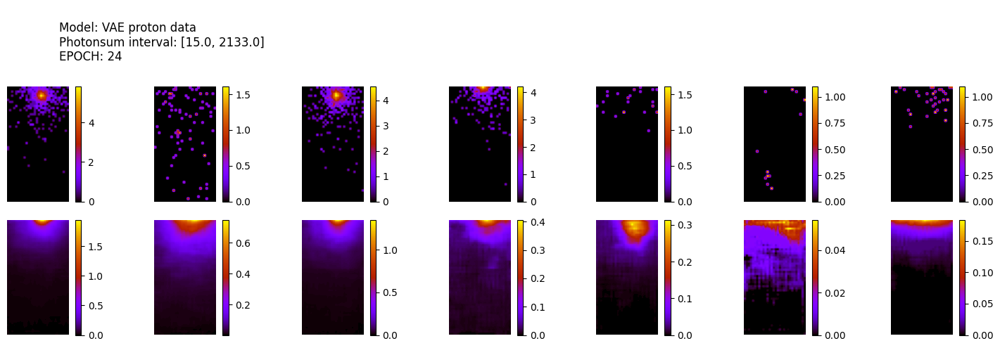

305/305 [==============================] - 1s 4ms/step
ws mean 26.74 ch1 0.02 ch2 5.44 ch3 0.26 ch4 61.33 ch5 66.64 Time for epoch 25 is 28.505282402038574 sec
7700 [Total loss: 38.43] [Recon_loss: 37.63] [KL loss: 1.14]
7800 [Total loss: 44.07] [Recon_loss: 43.14] [KL loss: 1.33]
7900 [Total loss: 37.49] [Recon_loss: 36.84] [KL loss: 0.94]


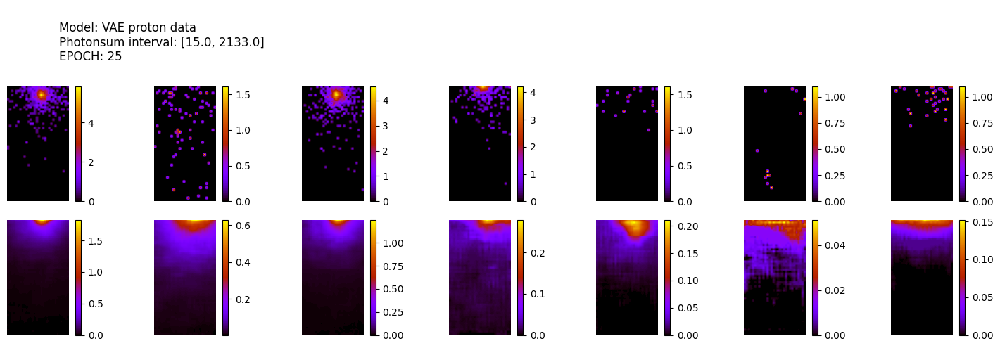

305/305 [==============================] - 1s 4ms/step
ws mean 29.44 ch1 0.02 ch2 6.58 ch3 0.31 ch4 66.93 ch5 73.34 Time for epoch 26 is 28.436914682388306 sec
8000 [Total loss: 34.99] [Recon_loss: 34.32] [KL loss: 0.96]
8100 [Total loss: 39.47] [Recon_loss: 38.68] [KL loss: 1.14]
8200 [Total loss: 37.28] [Recon_loss: 36.59] [KL loss: 0.99]


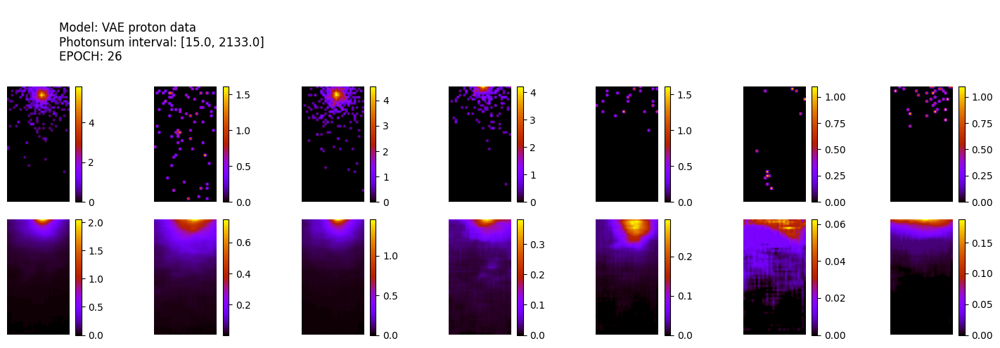

305/305 [==============================] - 1s 4ms/step
ws mean 25.86 ch1 0.02 ch2 5.23 ch3 0.28 ch4 59.33 ch5 64.43 Time for epoch 27 is 28.45679783821106 sec
8300 [Total loss: 43.22] [Recon_loss: 42.24] [KL loss: 1.41]
8400 [Total loss: 44.29] [Recon_loss: 43.41] [KL loss: 1.25]
8500 [Total loss: 40.65] [Recon_loss: 39.80] [KL loss: 1.21]


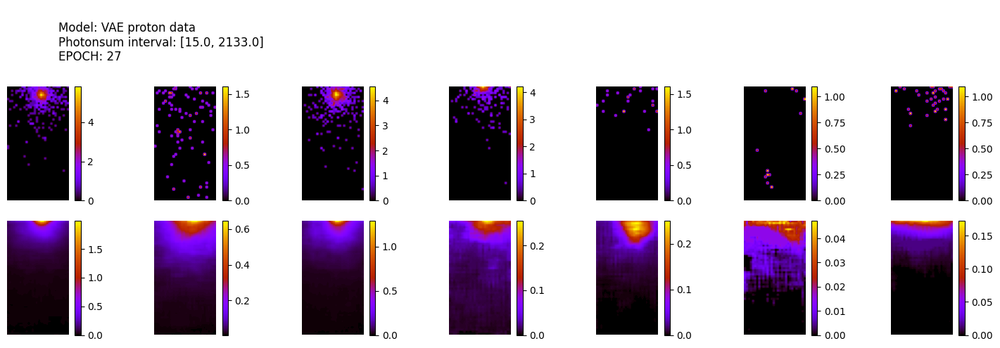

305/305 [==============================] - 1s 4ms/step
ws mean 27.94 ch1 0.02 ch2 6.03 ch3 0.25 ch4 63.74 ch5 69.66 Time for epoch 28 is 28.452527046203613 sec
8600 [Total loss: 30.30] [Recon_loss: 29.76] [KL loss: 0.77]
8700 [Total loss: 34.66] [Recon_loss: 33.90] [KL loss: 1.10]
8800 [Total loss: 30.34] [Recon_loss: 29.79] [KL loss: 0.78]


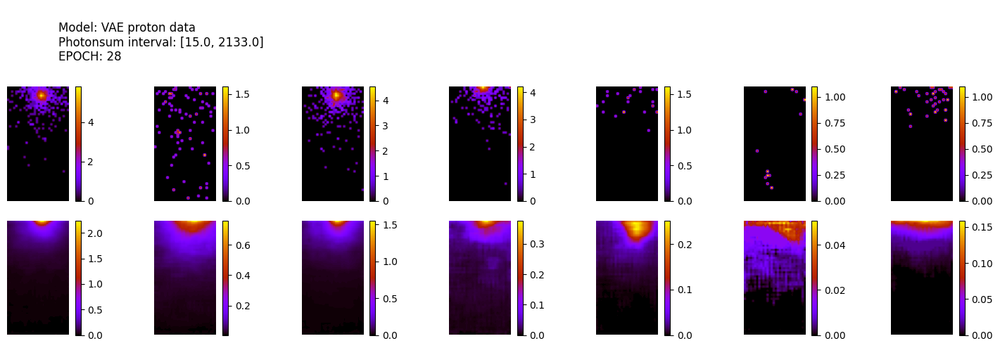

305/305 [==============================] - 1s 4ms/step
ws mean 25.96 ch1 0.02 ch2 5.56 ch3 0.26 ch4 59.16 ch5 64.82 Time for epoch 29 is 28.491599798202515 sec
8900 [Total loss: 38.70] [Recon_loss: 37.92] [KL loss: 1.11]
9000 [Total loss: 41.45] [Recon_loss: 40.56] [KL loss: 1.27]
9100 [Total loss: 41.37] [Recon_loss: 40.48] [KL loss: 1.27]


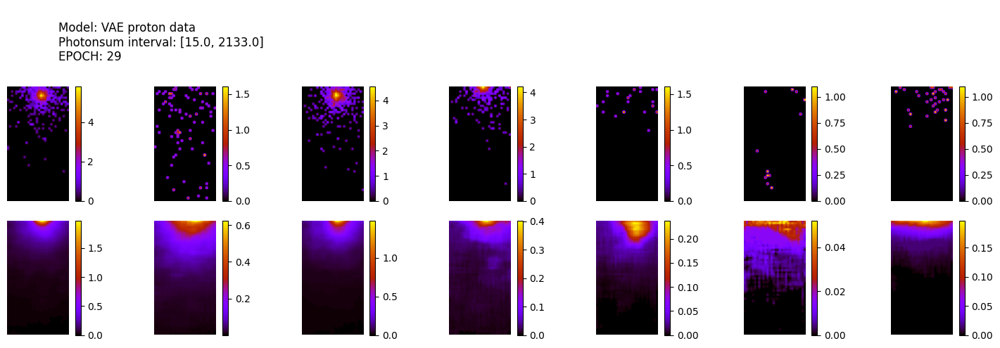

305/305 [==============================] - 1s 4ms/step
ws mean 26.65 ch1 0.02 ch2 5.44 ch3 0.26 ch4 61.11 ch5 66.43 Time for epoch 30 is 28.512582778930664 sec
9200 [Total loss: 46.16] [Recon_loss: 45.26] [KL loss: 1.28]
9300 [Total loss: 30.97] [Recon_loss: 30.46] [KL loss: 0.73]
9400 [Total loss: 38.60] [Recon_loss: 37.84] [KL loss: 1.09]


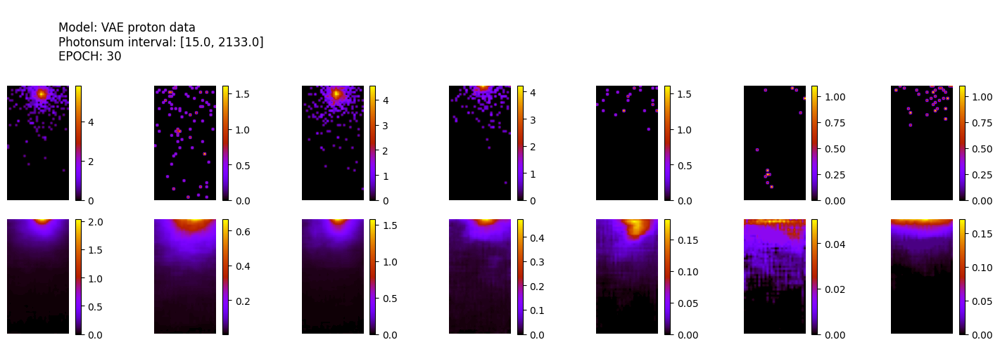

305/305 [==============================] - 1s 4ms/step
ws mean 26.71 ch1 0.02 ch2 5.97 ch3 0.27 ch4 60.72 ch5 66.57 Time for epoch 31 is 29.485376834869385 sec
9500 [Total loss: 46.24] [Recon_loss: 45.27] [KL loss: 1.39]
9600 [Total loss: 40.63] [Recon_loss: 39.89] [KL loss: 1.06]
9700 [Total loss: 45.25] [Recon_loss: 44.23] [KL loss: 1.46]


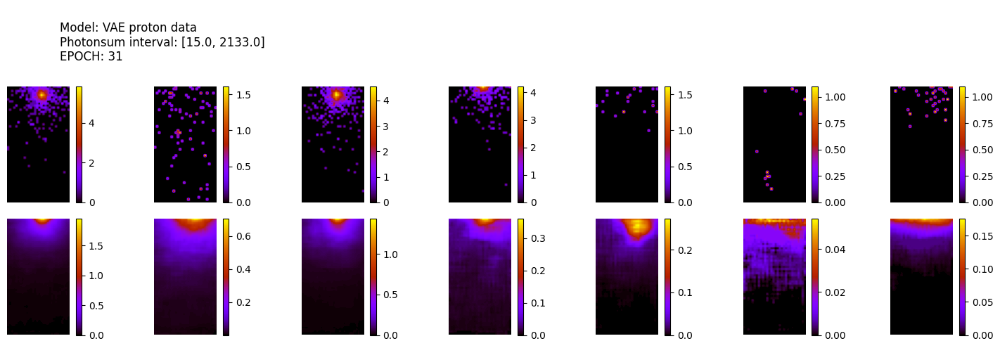

305/305 [==============================] - 1s 4ms/step
ws mean 28.87 ch1 0.02 ch2 6.14 ch3 0.27 ch4 65.97 ch5 71.97 Time for epoch 32 is 28.443115234375 sec
9800 [Total loss: 42.70] [Recon_loss: 41.86] [KL loss: 1.21]
9900 [Total loss: 44.68] [Recon_loss: 43.64] [KL loss: 1.48]
10000 [Total loss: 44.93] [Recon_loss: 43.98] [KL loss: 1.37]


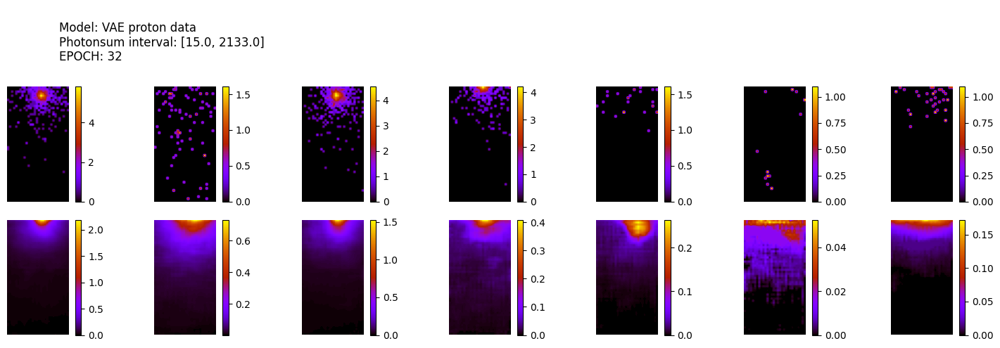

305/305 [==============================] - 1s 4ms/step
ws mean 25.42 ch1 0.02 ch2 5.57 ch3 0.26 ch4 58.00 ch5 63.23 Time for epoch 33 is 28.479217052459717 sec
10100 [Total loss: 41.96] [Recon_loss: 41.12] [KL loss: 1.20]
10200 [Total loss: 39.44] [Recon_loss: 38.71] [KL loss: 1.05]
10300 [Total loss: 42.26] [Recon_loss: 41.25] [KL loss: 1.45]


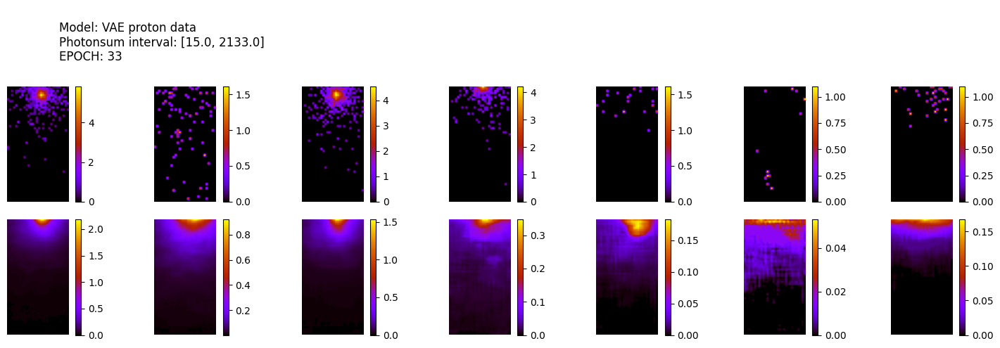

305/305 [==============================] - 1s 4ms/step
ws mean 24.28 ch1 0.02 ch2 5.84 ch3 0.24 ch4 54.82 ch5 60.50 Time for epoch 34 is 28.517561197280884 sec
10400 [Total loss: 34.38] [Recon_loss: 33.76] [KL loss: 0.89]
10500 [Total loss: 43.22] [Recon_loss: 42.26] [KL loss: 1.37]
10600 [Total loss: 44.49] [Recon_loss: 43.64] [KL loss: 1.22]


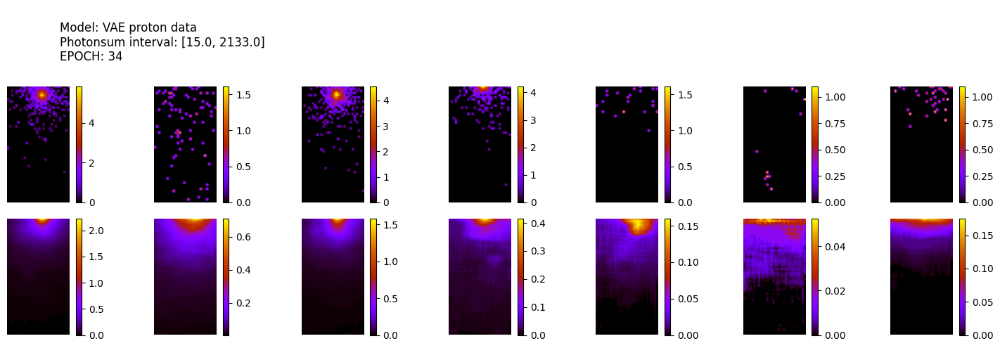

305/305 [==============================] - 1s 4ms/step
ws mean 28.12 ch1 0.02 ch2 6.12 ch3 0.29 ch4 64.06 ch5 70.09 Time for epoch 35 is 28.53746199607849 sec
10700 [Total loss: 41.11] [Recon_loss: 40.25] [KL loss: 1.22]
10800 [Total loss: 34.33] [Recon_loss: 33.78] [KL loss: 0.78]
10900 [Total loss: 42.95] [Recon_loss: 42.13] [KL loss: 1.17]


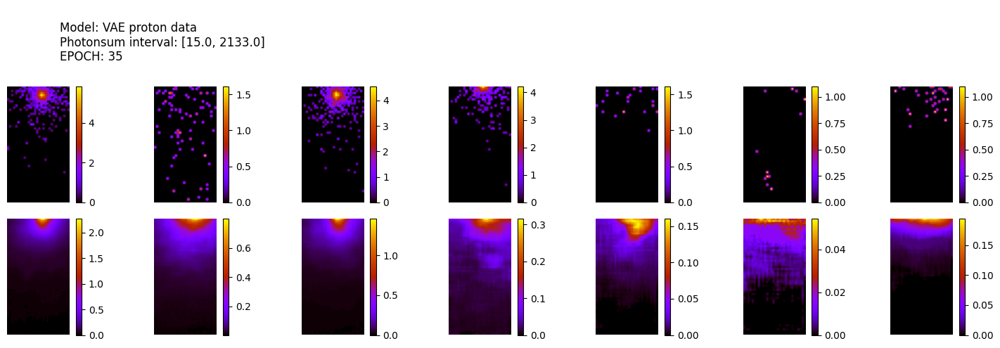

305/305 [==============================] - 1s 4ms/step
ws mean 26.14 ch1 0.02 ch2 5.70 ch3 0.25 ch4 59.63 ch5 65.11 Time for epoch 36 is 28.554197788238525 sec
11000 [Total loss: 42.41] [Recon_loss: 41.58] [KL loss: 1.19]
11100 [Total loss: 38.53] [Recon_loss: 37.89] [KL loss: 0.91]
11200 [Total loss: 37.17] [Recon_loss: 36.64] [KL loss: 0.76]


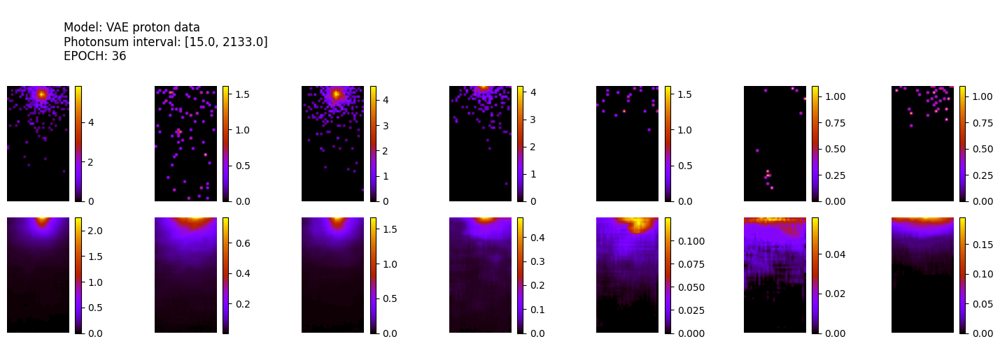

305/305 [==============================] - 1s 4ms/step
ws mean 25.88 ch1 0.02 ch2 6.13 ch3 0.24 ch4 58.52 ch5 64.52 Time for epoch 37 is 28.59765338897705 sec
11300 [Total loss: 43.66] [Recon_loss: 42.90] [KL loss: 1.09]
11400 [Total loss: 31.17] [Recon_loss: 30.68] [KL loss: 0.70]
11500 [Total loss: 39.17] [Recon_loss: 38.50] [KL loss: 0.95]


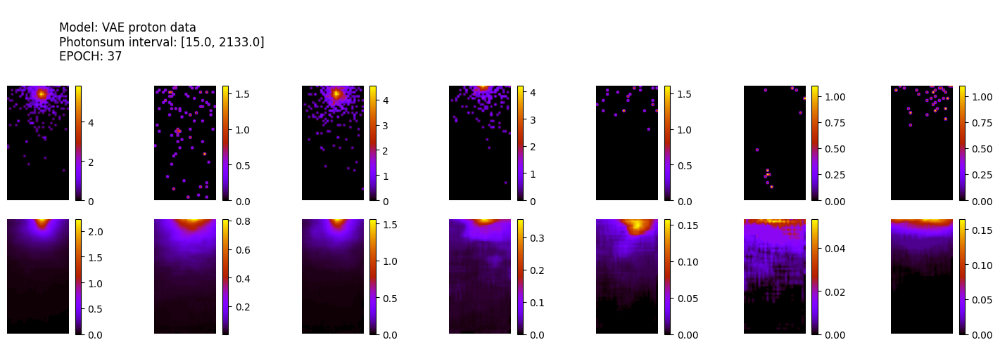

305/305 [==============================] - 1s 4ms/step
ws mean 28.38 ch1 0.02 ch2 6.02 ch3 0.27 ch4 64.87 ch5 70.73 Time for epoch 38 is 28.580960988998413 sec
11600 [Total loss: 35.94] [Recon_loss: 35.37] [KL loss: 0.82]
11700 [Total loss: 42.92] [Recon_loss: 42.06] [KL loss: 1.22]
11800 [Total loss: 40.70] [Recon_loss: 40.12] [KL loss: 0.83]


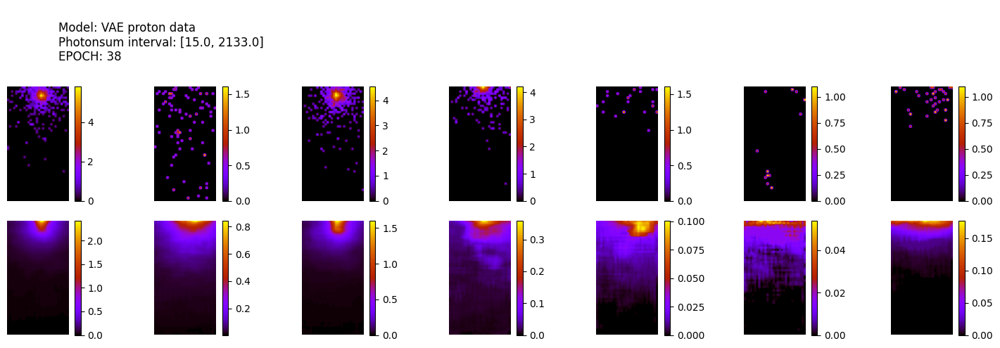

305/305 [==============================] - 1s 4ms/step
ws mean 23.25 ch1 0.02 ch2 5.64 ch3 0.23 ch4 52.39 ch5 57.98 Time for epoch 39 is 28.565489768981934 sec
11900 [Total loss: 39.13] [Recon_loss: 38.29] [KL loss: 1.20]
12000 [Total loss: 45.45] [Recon_loss: 44.51] [KL loss: 1.35]
12100 [Total loss: 33.59] [Recon_loss: 33.10] [KL loss: 0.70]
12200 [Total loss: 35.44] [Recon_loss: 34.86] [KL loss: 0.83]


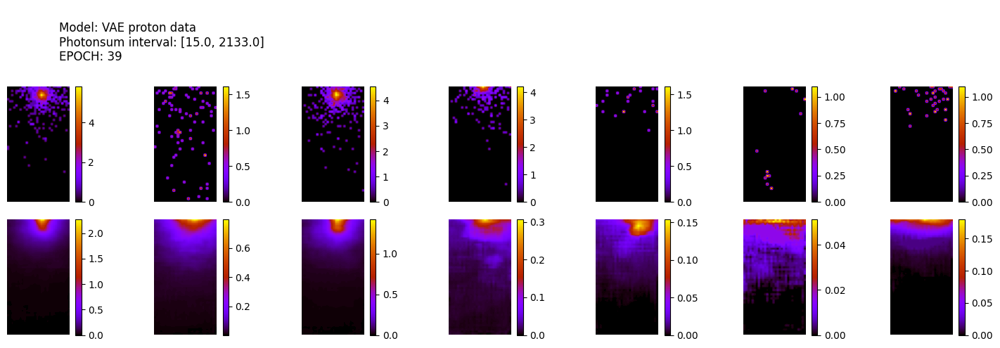

305/305 [==============================] - 1s 4ms/step
ws mean 25.60 ch1 0.02 ch2 6.43 ch3 0.26 ch4 57.45 ch5 63.83 Time for epoch 40 is 28.491150379180908 sec
12300 [Total loss: 32.40] [Recon_loss: 31.93] [KL loss: 0.68]
12400 [Total loss: 44.63] [Recon_loss: 43.79] [KL loss: 1.19]
12500 [Total loss: 43.15] [Recon_loss: 42.30] [KL loss: 1.22]


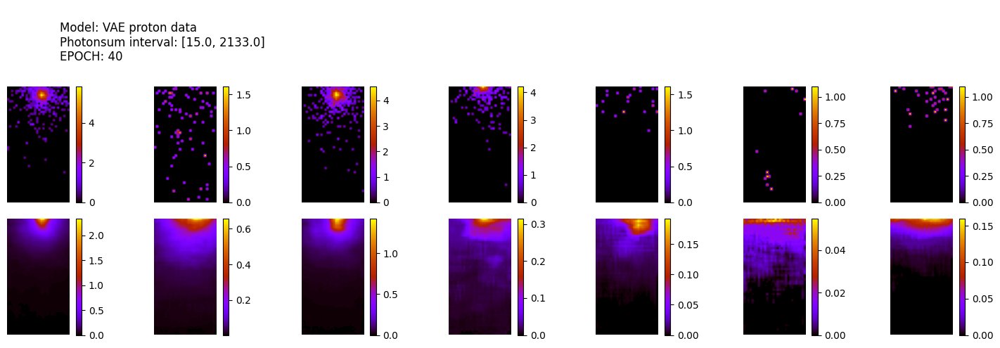

305/305 [==============================] - 1s 4ms/step
ws mean 27.12 ch1 0.02 ch2 6.28 ch3 0.27 ch4 61.36 ch5 67.67 Time for epoch 41 is 28.57104253768921 sec
12600 [Total loss: 42.76] [Recon_loss: 42.03] [KL loss: 1.04]
12700 [Total loss: 45.98] [Recon_loss: 45.00] [KL loss: 1.40]
12800 [Total loss: 45.47] [Recon_loss: 44.67] [KL loss: 1.13]


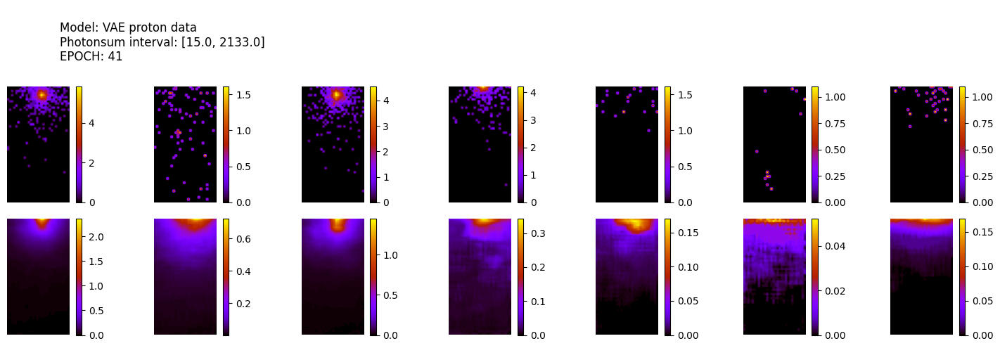

305/305 [==============================] - 1s 4ms/step
ws mean 26.00 ch1 0.02 ch2 6.12 ch3 0.24 ch4 58.79 ch5 64.80 Time for epoch 42 is 28.534881591796875 sec
12900 [Total loss: 36.90] [Recon_loss: 36.35] [KL loss: 0.79]
13000 [Total loss: 42.71] [Recon_loss: 41.78] [KL loss: 1.33]
13100 [Total loss: 42.29] [Recon_loss: 41.44] [KL loss: 1.22]


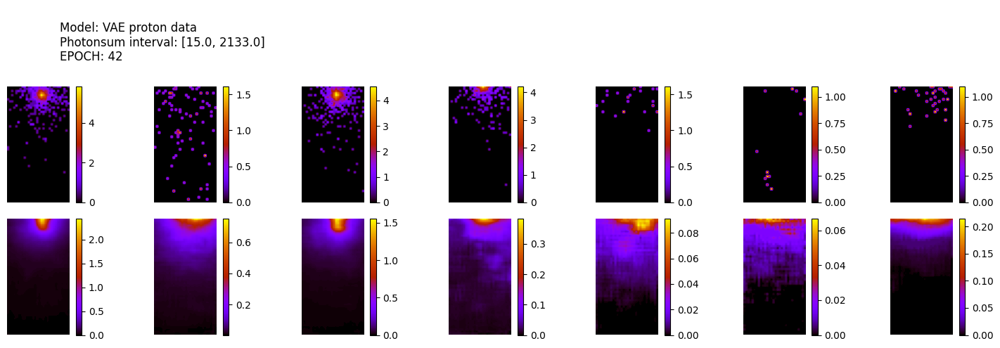

305/305 [==============================] - 1s 4ms/step
ws mean 23.73 ch1 0.02 ch2 5.83 ch3 0.25 ch4 53.41 ch5 59.14 Time for epoch 43 is 28.59273052215576 sec
13200 [Total loss: 34.69] [Recon_loss: 34.00] [KL loss: 0.99]
13300 [Total loss: 46.61] [Recon_loss: 45.70] [KL loss: 1.31]
13400 [Total loss: 39.21] [Recon_loss: 38.54] [KL loss: 0.95]


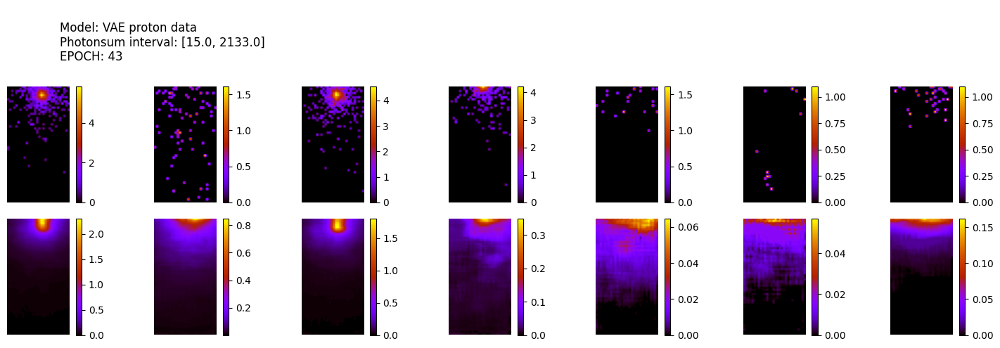

305/305 [==============================] - 1s 4ms/step
ws mean 24.96 ch1 0.02 ch2 6.19 ch3 0.26 ch4 56.13 ch5 62.20 Time for epoch 44 is 28.55705428123474 sec
13500 [Total loss: 47.70] [Recon_loss: 46.78] [KL loss: 1.32]
13600 [Total loss: 26.81] [Recon_loss: 26.49] [KL loss: 0.46]
13700 [Total loss: 33.93] [Recon_loss: 33.45] [KL loss: 0.68]


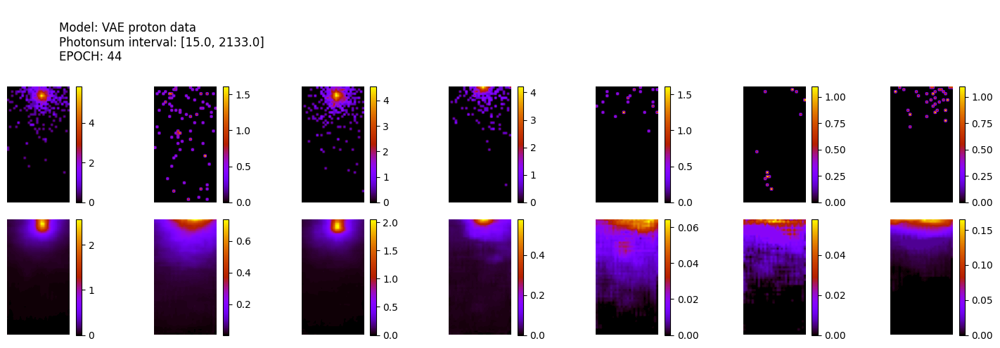

305/305 [==============================] - 1s 4ms/step
ws mean 25.21 ch1 0.02 ch2 6.04 ch3 0.24 ch4 57.00 ch5 62.75 Time for epoch 45 is 28.82251763343811 sec
13800 [Total loss: 32.47] [Recon_loss: 32.03] [KL loss: 0.63]
13900 [Total loss: 39.32] [Recon_loss: 38.64] [KL loss: 0.97]
14000 [Total loss: 45.77] [Recon_loss: 44.96] [KL loss: 1.16]


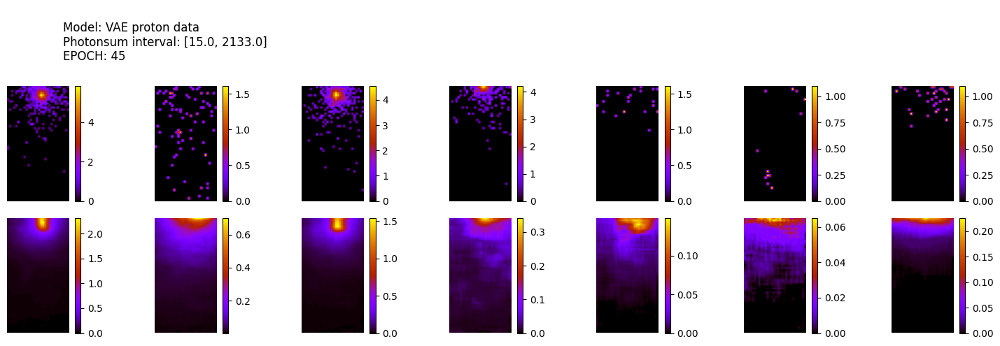

305/305 [==============================] - 1s 4ms/step
ws mean 24.66 ch1 0.02 ch2 5.78 ch3 0.23 ch4 55.81 ch5 61.44 Time for epoch 46 is 28.588391304016113 sec
14100 [Total loss: 40.15] [Recon_loss: 39.44] [KL loss: 1.01]
14200 [Total loss: 43.44] [Recon_loss: 42.57] [KL loss: 1.23]
14300 [Total loss: 41.04] [Recon_loss: 40.23] [KL loss: 1.16]


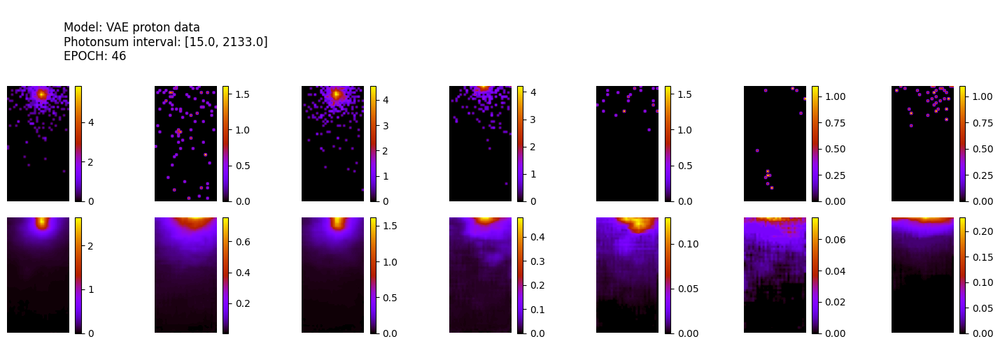

305/305 [==============================] - 1s 4ms/step
ws mean 24.34 ch1 0.02 ch2 5.74 ch3 0.23 ch4 55.13 ch5 60.57 Time for epoch 47 is 28.67243504524231 sec
14400 [Total loss: 32.19] [Recon_loss: 31.77] [KL loss: 0.60]
14500 [Total loss: 31.76] [Recon_loss: 31.30] [KL loss: 0.65]
14600 [Total loss: 42.86] [Recon_loss: 41.98] [KL loss: 1.25]


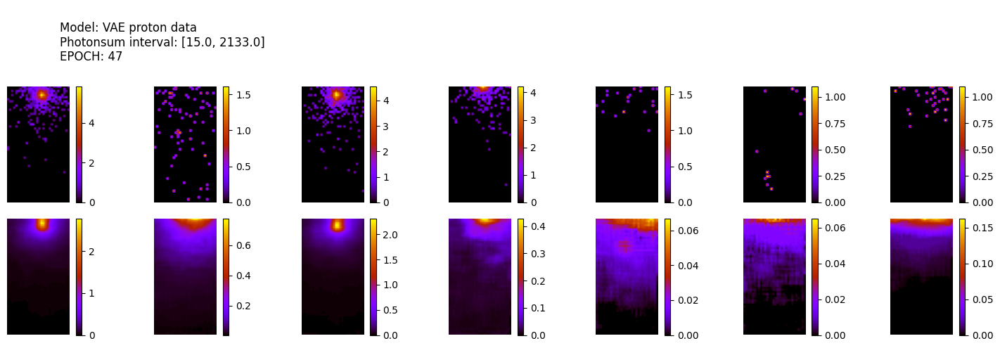

305/305 [==============================] - 1s 4ms/step
ws mean 22.59 ch1 0.02 ch2 5.80 ch3 0.22 ch4 50.72 ch5 56.22 Time for epoch 48 is 28.58517074584961 sec
14700 [Total loss: 43.77] [Recon_loss: 43.07] [KL loss: 1.00]
14800 [Total loss: 46.35] [Recon_loss: 45.55] [KL loss: 1.14]
14900 [Total loss: 28.38] [Recon_loss: 28.03] [KL loss: 0.49]


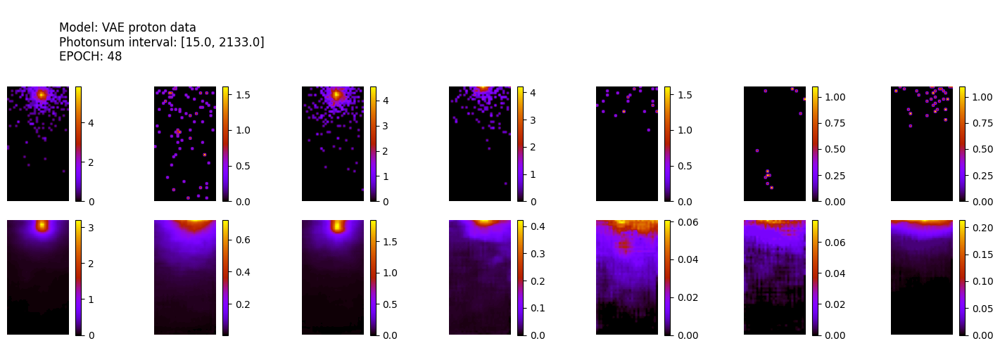

305/305 [==============================] - 1s 4ms/step
ws mean 21.99 ch1 0.02 ch2 5.40 ch3 0.24 ch4 49.66 ch5 54.65 Time for epoch 49 is 28.56650185585022 sec
15000 [Total loss: 43.68] [Recon_loss: 42.94] [KL loss: 1.06]
15100 [Total loss: 35.45] [Recon_loss: 34.99] [KL loss: 0.66]
15200 [Total loss: 26.93] [Recon_loss: 26.62] [KL loss: 0.45]


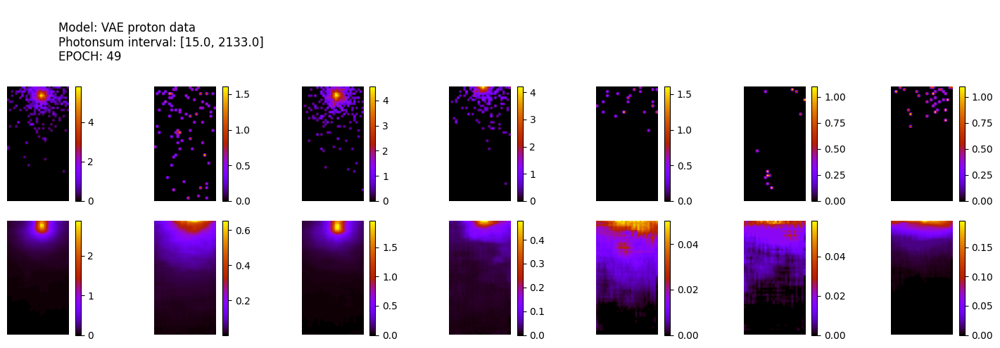

305/305 [==============================] - 1s 4ms/step
ws mean 26.70 ch1 0.02 ch2 6.17 ch3 0.26 ch4 60.45 ch5 66.62 Time for epoch 50 is 28.613471508026123 sec
15300 [Total loss: 43.50] [Recon_loss: 42.73] [KL loss: 1.09]
15400 [Total loss: 36.19] [Recon_loss: 35.63] [KL loss: 0.81]
15500 [Total loss: 37.81] [Recon_loss: 37.23] [KL loss: 0.82]


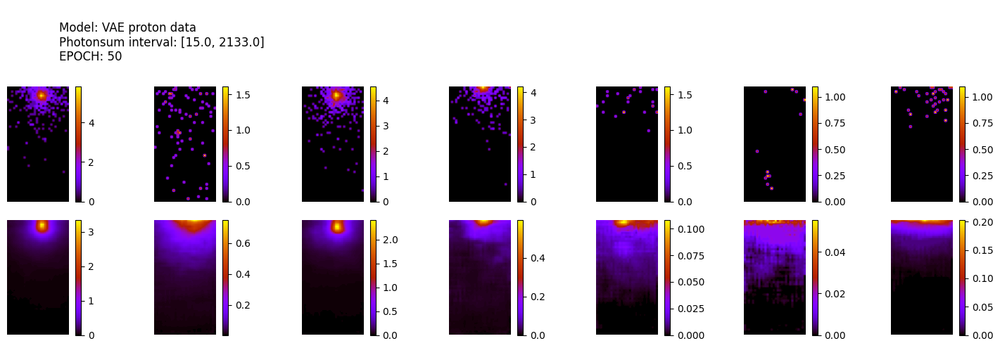

305/305 [==============================] - 1s 4ms/step
ws mean 22.23 ch1 0.02 ch2 5.72 ch3 0.24 ch4 49.75 ch5 55.40 Time for epoch 51 is 28.622313976287842 sec
15600 [Total loss: 42.49] [Recon_loss: 41.67] [KL loss: 1.17]
15700 [Total loss: 38.70] [Recon_loss: 38.04] [KL loss: 0.95]
15800 [Total loss: 42.42] [Recon_loss: 41.50] [KL loss: 1.30]


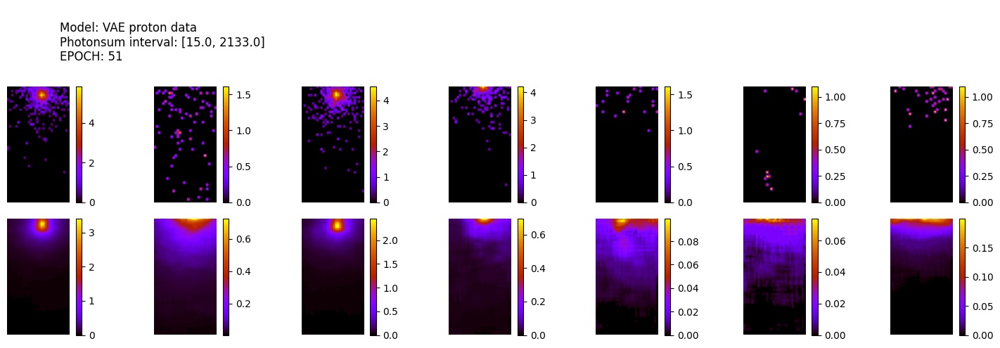

305/305 [==============================] - 1s 4ms/step
ws mean 23.36 ch1 0.02 ch2 5.74 ch3 0.24 ch4 52.68 ch5 58.13 Time for epoch 52 is 28.57172465324402 sec
15900 [Total loss: 38.03] [Recon_loss: 37.46] [KL loss: 0.81]
16000 [Total loss: 36.97] [Recon_loss: 36.40] [KL loss: 0.82]
16100 [Total loss: 44.19] [Recon_loss: 43.51] [KL loss: 0.97]


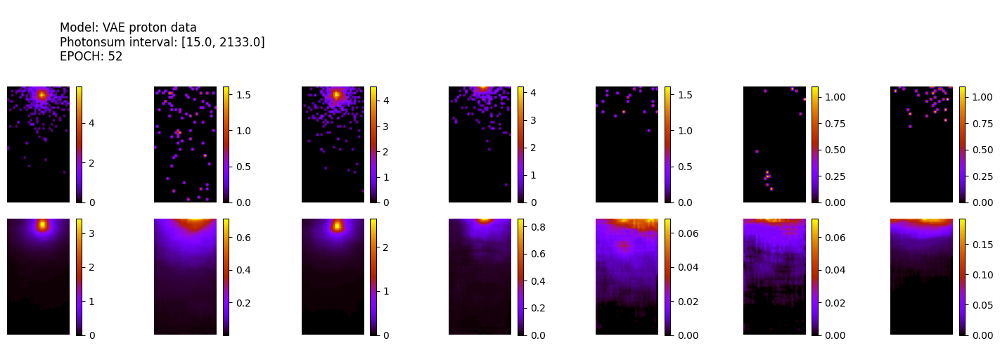

305/305 [==============================] - 1s 4ms/step
ws mean 22.84 ch1 0.02 ch2 6.07 ch3 0.21 ch4 51.07 ch5 56.85 Time for epoch 53 is 28.64483332633972 sec
16200 [Total loss: 44.42] [Recon_loss: 43.61] [KL loss: 1.16]
16300 [Total loss: 42.33] [Recon_loss: 41.59] [KL loss: 1.07]
16400 [Total loss: 36.89] [Recon_loss: 36.35] [KL loss: 0.77]


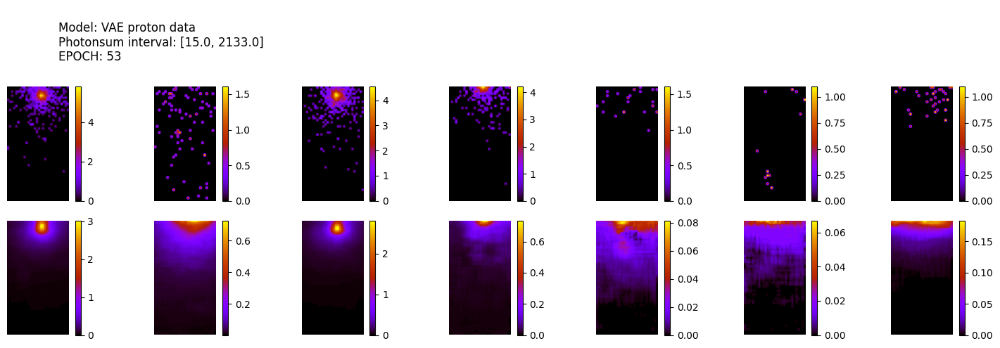

305/305 [==============================] - 1s 4ms/step
ws mean 20.70 ch1 0.02 ch2 5.90 ch3 0.20 ch4 45.76 ch5 51.62 Time for epoch 54 is 28.565229654312134 sec
16500 [Total loss: 43.13] [Recon_loss: 42.38] [KL loss: 1.07]
16600 [Total loss: 41.00] [Recon_loss: 40.30] [KL loss: 1.00]
16700 [Total loss: 37.45] [Recon_loss: 36.86] [KL loss: 0.84]


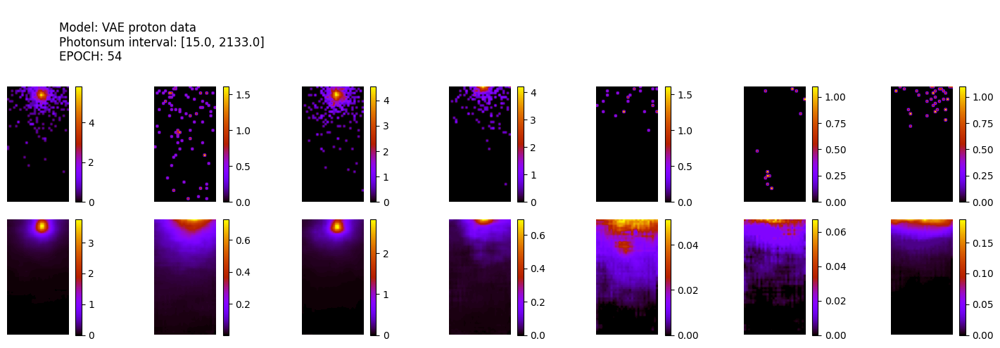

305/305 [==============================] - 1s 4ms/step
ws mean 24.04 ch1 0.02 ch2 5.89 ch3 0.23 ch4 54.30 ch5 59.74 Time for epoch 55 is 28.69388437271118 sec
16800 [Total loss: 39.91] [Recon_loss: 39.21] [KL loss: 0.99]
16900 [Total loss: 40.97] [Recon_loss: 40.25] [KL loss: 1.04]
17000 [Total loss: 39.79] [Recon_loss: 39.07] [KL loss: 1.02]


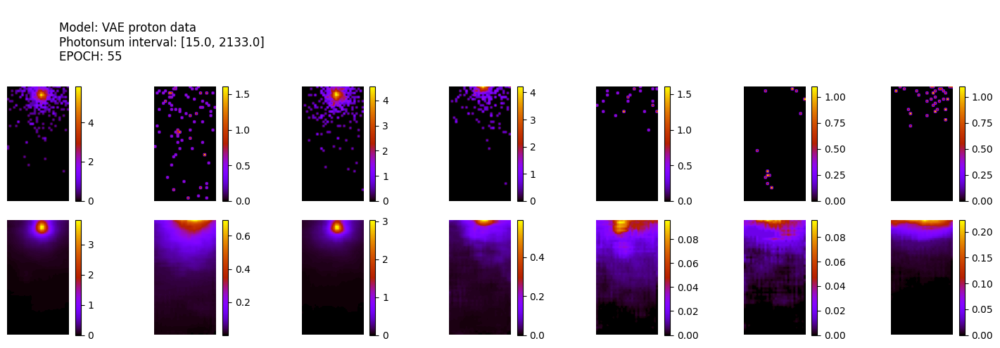

305/305 [==============================] - 1s 4ms/step
ws mean 22.96 ch1 0.02 ch2 5.40 ch3 0.24 ch4 51.99 ch5 57.13 Time for epoch 56 is 28.687448501586914 sec
17100 [Total loss: 33.88] [Recon_loss: 33.44] [KL loss: 0.63]
17200 [Total loss: 42.53] [Recon_loss: 41.77] [KL loss: 1.09]
17300 [Total loss: 34.38] [Recon_loss: 33.81] [KL loss: 0.81]


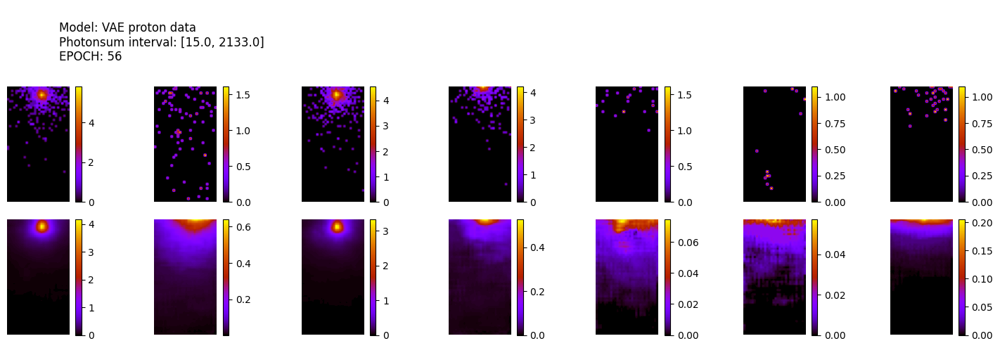

305/305 [==============================] - 1s 4ms/step
ws mean 22.58 ch1 0.02 ch2 6.10 ch3 0.19 ch4 50.33 ch5 56.28 Time for epoch 57 is 28.870763778686523 sec
17400 [Total loss: 41.62] [Recon_loss: 40.85] [KL loss: 1.10]
17500 [Total loss: 33.97] [Recon_loss: 33.49] [KL loss: 0.68]
17600 [Total loss: 40.31] [Recon_loss: 39.76] [KL loss: 0.79]


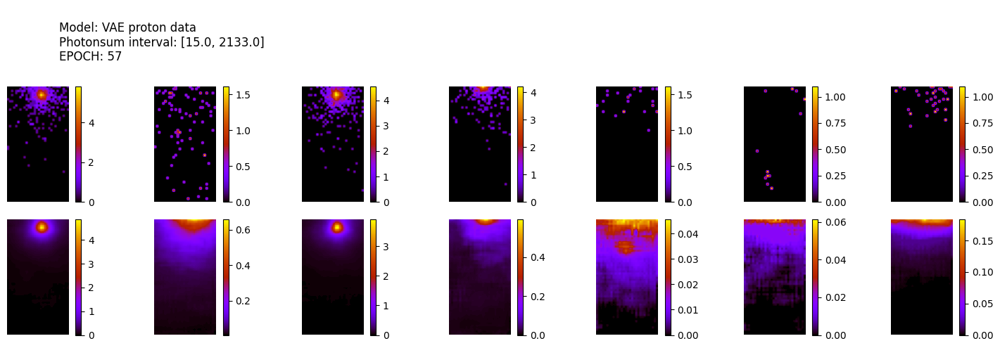

305/305 [==============================] - 1s 4ms/step
ws mean 22.96 ch1 0.02 ch2 5.91 ch3 0.23 ch4 51.35 ch5 57.27 Time for epoch 58 is 28.604336261749268 sec
17700 [Total loss: 46.66] [Recon_loss: 45.68] [KL loss: 1.40]
17800 [Total loss: 39.49] [Recon_loss: 38.93] [KL loss: 0.81]
17900 [Total loss: 39.92] [Recon_loss: 39.27] [KL loss: 0.92]


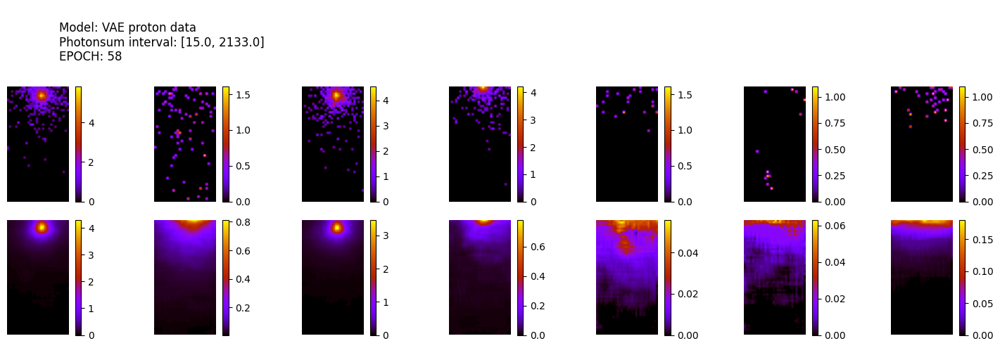

305/305 [==============================] - 1s 4ms/step
ws mean 19.40 ch1 0.02 ch2 5.72 ch3 0.21 ch4 42.71 ch5 48.33 Time for epoch 59 is 28.6154363155365 sec
18000 [Total loss: 44.14] [Recon_loss: 43.17] [KL loss: 1.38]
18100 [Total loss: 37.27] [Recon_loss: 36.80] [KL loss: 0.68]
18200 [Total loss: 42.90] [Recon_loss: 42.16] [KL loss: 1.05]
18300 [Total loss: 38.01] [Recon_loss: 37.40] [KL loss: 0.87]


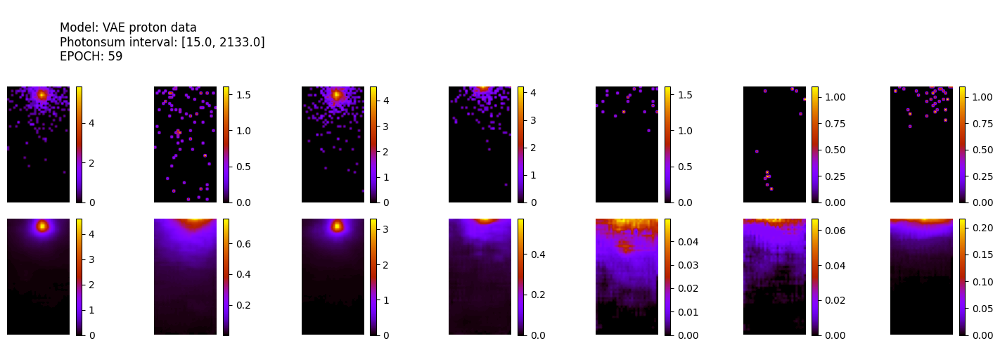

305/305 [==============================] - 1s 4ms/step
ws mean 22.16 ch1 0.02 ch2 6.24 ch3 0.25 ch4 49.04 ch5 55.24 Time for epoch 60 is 28.689372062683105 sec
18400 [Total loss: 41.05] [Recon_loss: 40.41] [KL loss: 0.92]
18500 [Total loss: 37.27] [Recon_loss: 36.74] [KL loss: 0.76]
18600 [Total loss: 32.83] [Recon_loss: 32.45] [KL loss: 0.55]


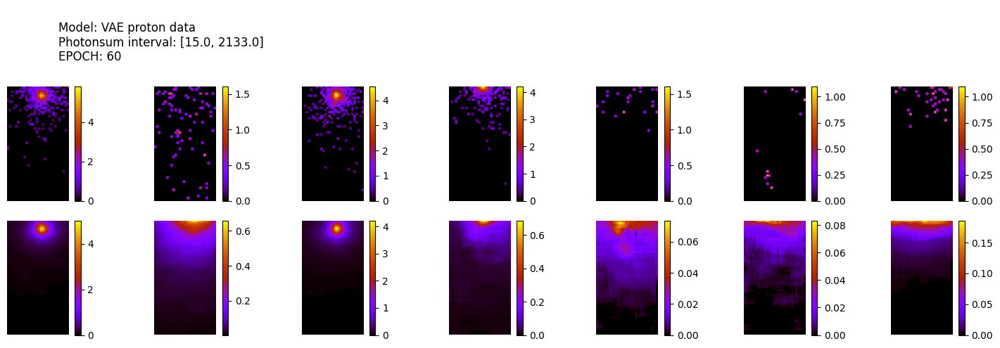

305/305 [==============================] - 1s 4ms/step
ws mean 22.30 ch1 0.02 ch2 5.72 ch3 0.22 ch4 50.09 ch5 55.48 Time for epoch 61 is 28.633243322372437 sec
18700 [Total loss: 38.35] [Recon_loss: 37.83] [KL loss: 0.75]
18800 [Total loss: 42.07] [Recon_loss: 41.32] [KL loss: 1.08]
18900 [Total loss: 38.77] [Recon_loss: 38.14] [KL loss: 0.90]


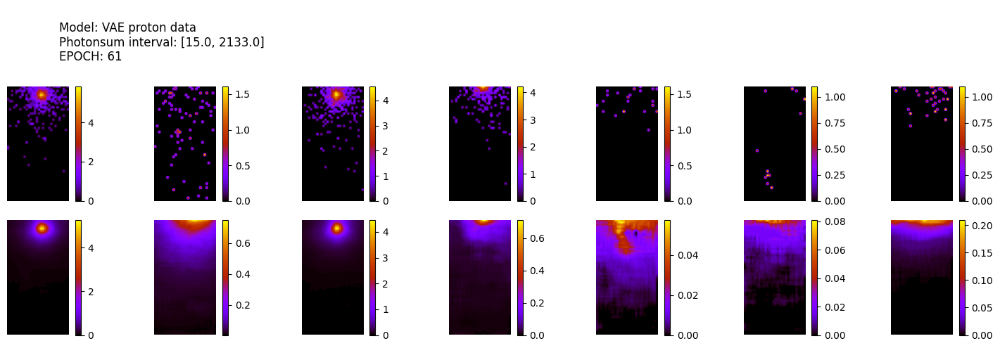

305/305 [==============================] - 1s 4ms/step
ws mean 19.41 ch1 0.02 ch2 5.64 ch3 0.22 ch4 42.83 ch5 48.34 Time for epoch 62 is 28.633520126342773 sec
19000 [Total loss: 43.64] [Recon_loss: 42.91] [KL loss: 1.04]
19100 [Total loss: 43.76] [Recon_loss: 43.05] [KL loss: 1.01]
19200 [Total loss: 39.18] [Recon_loss: 38.67] [KL loss: 0.73]


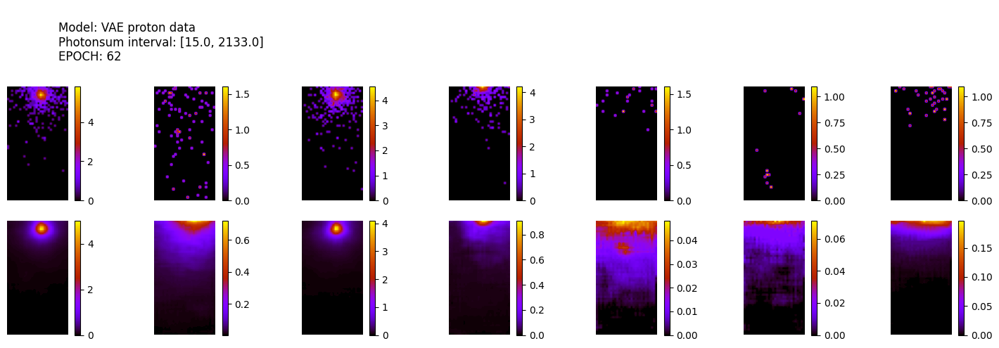

305/305 [==============================] - 1s 4ms/step
ws mean 19.14 ch1 0.02 ch2 5.75 ch3 0.18 ch4 41.97 ch5 47.79 Time for epoch 63 is 28.62629532814026 sec
19300 [Total loss: 47.02] [Recon_loss: 46.29] [KL loss: 1.04]
19400 [Total loss: 47.05] [Recon_loss: 46.17] [KL loss: 1.26]
19500 [Total loss: 39.68] [Recon_loss: 39.05] [KL loss: 0.91]


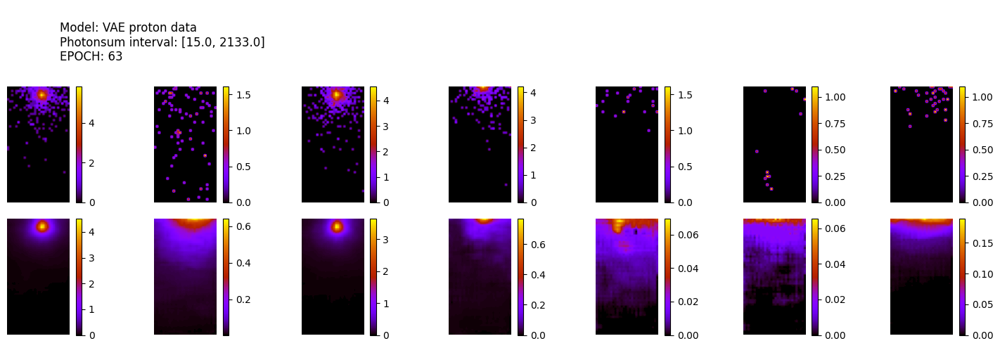

305/305 [==============================] - 1s 4ms/step
ws mean 21.98 ch1 0.02 ch2 6.06 ch3 0.22 ch4 48.84 ch5 54.75 Time for epoch 64 is 28.875536918640137 sec
19600 [Total loss: 37.22] [Recon_loss: 36.79] [KL loss: 0.62]
19700 [Total loss: 40.76] [Recon_loss: 40.18] [KL loss: 0.82]
19800 [Total loss: 43.54] [Recon_loss: 42.81] [KL loss: 1.04]


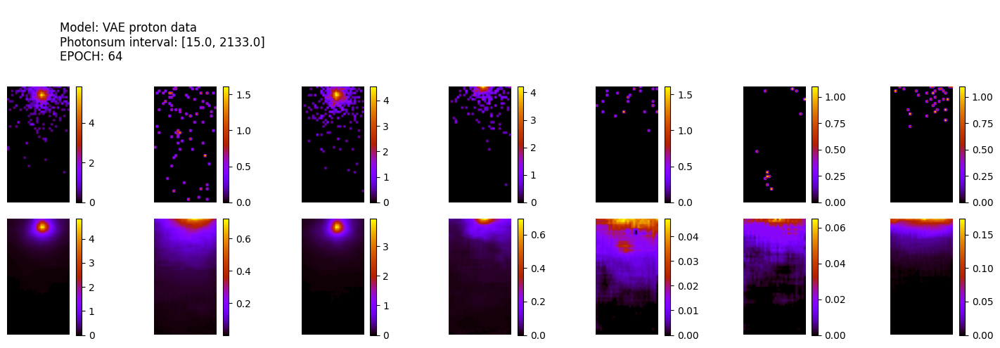

305/305 [==============================] - 1s 4ms/step
ws mean 22.44 ch1 0.02 ch2 6.46 ch3 0.23 ch4 49.63 ch5 55.88 Time for epoch 65 is 28.66307783126831 sec
19900 [Total loss: 26.61] [Recon_loss: 26.32] [KL loss: 0.42]
20000 [Total loss: 40.63] [Recon_loss: 39.90] [KL loss: 1.05]
20100 [Total loss: 32.79] [Recon_loss: 32.44] [KL loss: 0.50]


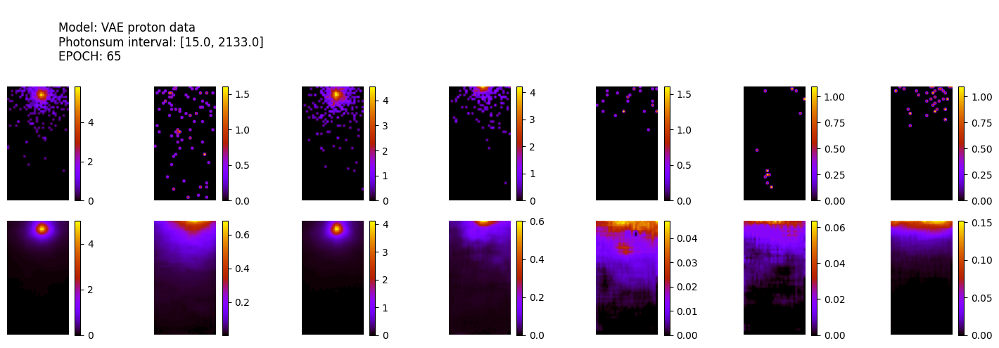

305/305 [==============================] - 1s 4ms/step
ws mean 20.31 ch1 0.02 ch2 6.16 ch3 0.21 ch4 44.41 ch5 50.75 Time for epoch 66 is 28.62717580795288 sec
20200 [Total loss: 43.84] [Recon_loss: 43.11] [KL loss: 1.05]
20300 [Total loss: 41.15] [Recon_loss: 40.46] [KL loss: 0.99]
20400 [Total loss: 46.97] [Recon_loss: 46.16] [KL loss: 1.16]


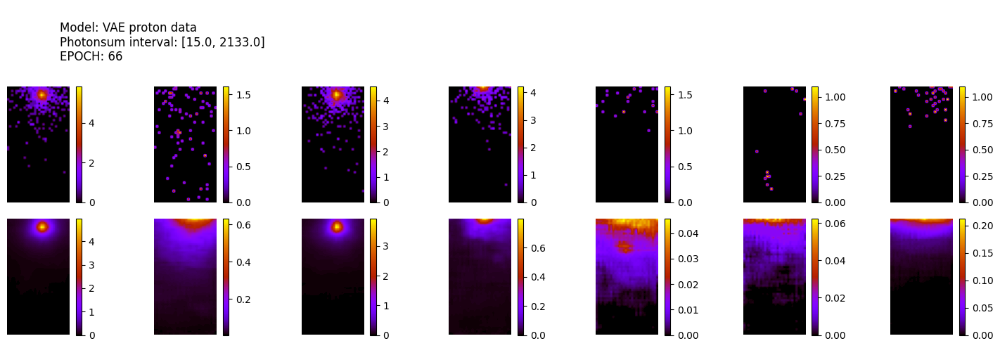

305/305 [==============================] - 1s 4ms/step
ws mean 23.93 ch1 0.02 ch2 6.45 ch3 0.23 ch4 53.36 ch5 59.57 Time for epoch 67 is 28.669565677642822 sec
20500 [Total loss: 36.88] [Recon_loss: 36.43] [KL loss: 0.64]
20600 [Total loss: 38.36] [Recon_loss: 37.81] [KL loss: 0.79]
20700 [Total loss: 40.57] [Recon_loss: 39.96] [KL loss: 0.88]


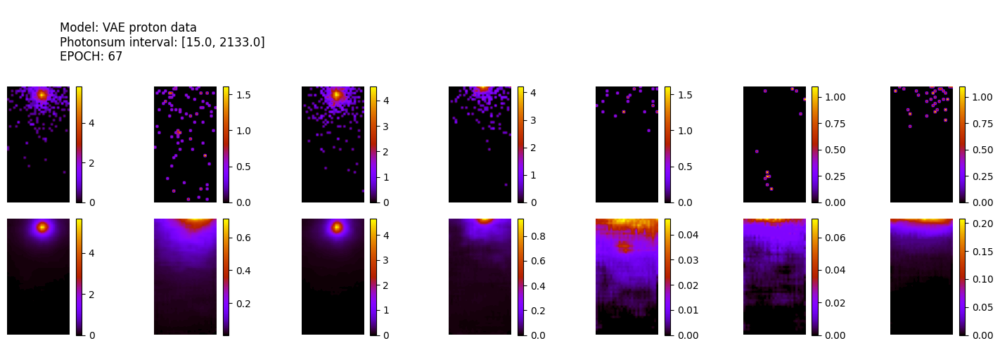

305/305 [==============================] - 1s 4ms/step
ws mean 18.13 ch1 0.02 ch2 5.81 ch3 0.20 ch4 39.48 ch5 45.12 Time for epoch 68 is 28.630141019821167 sec
20800 [Total loss: 34.19] [Recon_loss: 33.70] [KL loss: 0.70]
20900 [Total loss: 38.51] [Recon_loss: 38.05] [KL loss: 0.66]
21000 [Total loss: 45.46] [Recon_loss: 44.77] [KL loss: 0.99]


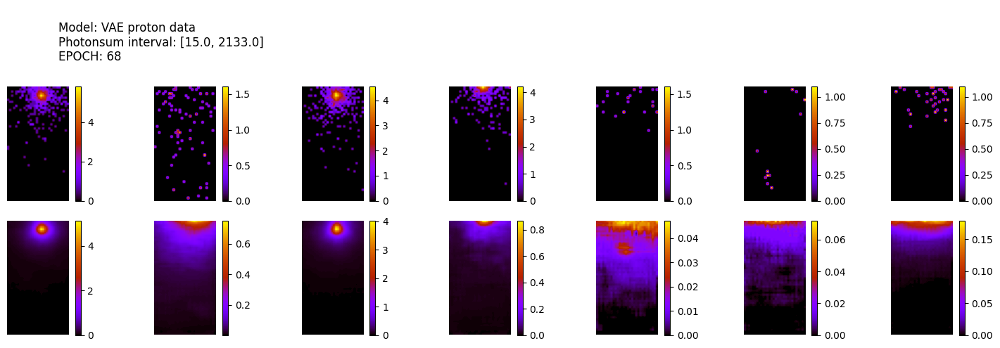

305/305 [==============================] - 1s 4ms/step
ws mean 20.97 ch1 0.02 ch2 5.91 ch3 0.21 ch4 46.42 ch5 52.30 Time for epoch 69 is 28.72849702835083 sec
21100 [Total loss: 35.31] [Recon_loss: 34.86] [KL loss: 0.64]
21200 [Total loss: 37.69] [Recon_loss: 37.19] [KL loss: 0.71]
21300 [Total loss: 40.46] [Recon_loss: 39.96] [KL loss: 0.71]


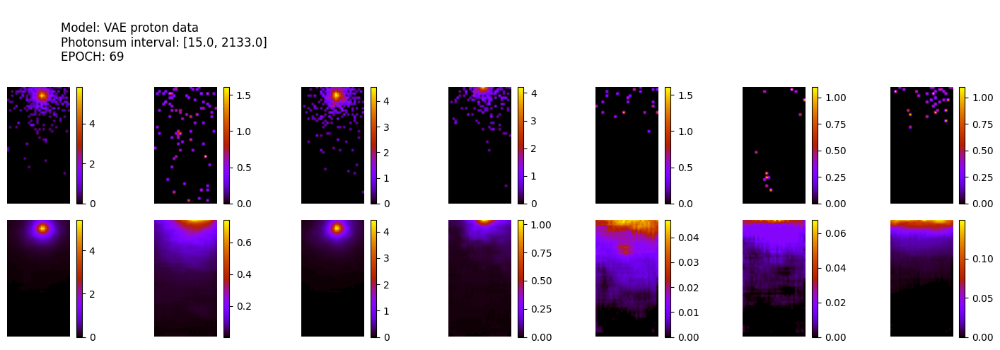

305/305 [==============================] - 1s 4ms/step
ws mean 18.01 ch1 0.02 ch2 5.88 ch3 0.19 ch4 39.17 ch5 44.79 Time for epoch 70 is 28.70272207260132 sec
21400 [Total loss: 42.69] [Recon_loss: 41.99] [KL loss: 0.99]
21500 [Total loss: 41.71] [Recon_loss: 41.01] [KL loss: 1.00]
21600 [Total loss: 41.89] [Recon_loss: 41.31] [KL loss: 0.83]


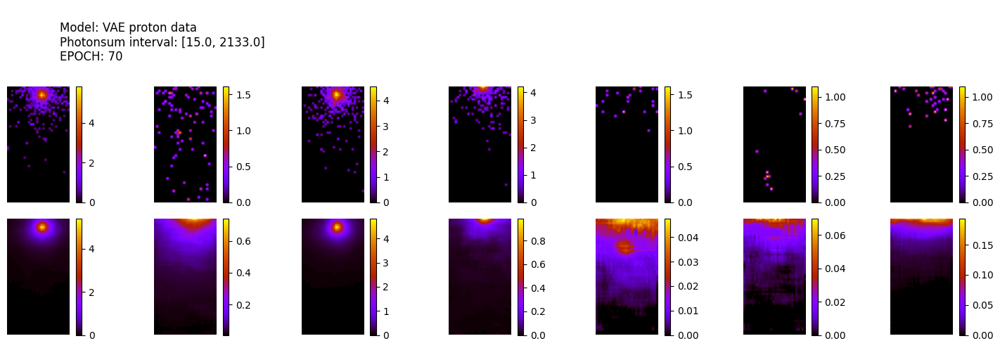

305/305 [==============================] - 1s 4ms/step
ws mean 17.41 ch1 0.02 ch2 5.54 ch3 0.19 ch4 37.99 ch5 43.33 Time for epoch 71 is 28.86043930053711 sec
21700 [Total loss: 37.59] [Recon_loss: 37.15] [KL loss: 0.63]
21800 [Total loss: 34.05] [Recon_loss: 33.66] [KL loss: 0.57]
21900 [Total loss: 40.07] [Recon_loss: 39.51] [KL loss: 0.81]


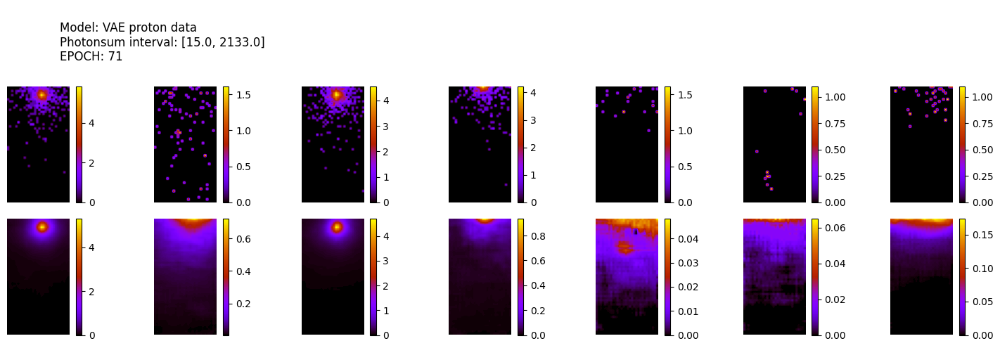

305/305 [==============================] - 1s 4ms/step
ws mean 17.46 ch1 0.02 ch2 5.40 ch3 0.19 ch4 38.16 ch5 43.54 Time for epoch 72 is 28.686527490615845 sec
22000 [Total loss: 34.43] [Recon_loss: 33.93] [KL loss: 0.71]
22100 [Total loss: 41.04] [Recon_loss: 40.37] [KL loss: 0.96]
22200 [Total loss: 42.17] [Recon_loss: 41.58] [KL loss: 0.84]


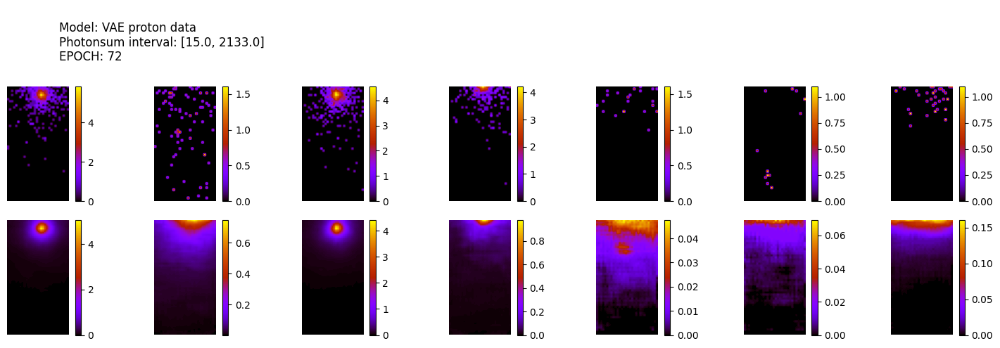

305/305 [==============================] - 1s 4ms/step
ws mean 19.78 ch1 0.02 ch2 6.03 ch3 0.21 ch4 43.32 ch5 49.32 Time for epoch 73 is 28.66906762123108 sec
22300 [Total loss: 46.91] [Recon_loss: 46.22] [KL loss: 0.97]
22400 [Total loss: 42.24] [Recon_loss: 41.58] [KL loss: 0.94]
22500 [Total loss: 29.86] [Recon_loss: 29.55] [KL loss: 0.43]


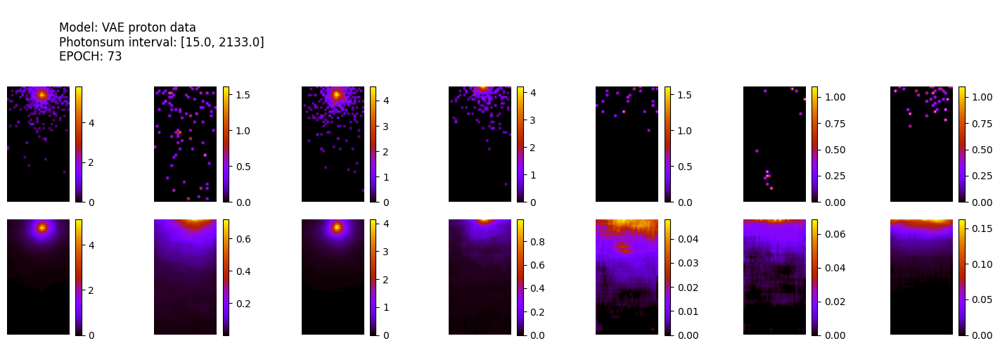

305/305 [==============================] - 1s 4ms/step
ws mean 20.74 ch1 0.02 ch2 6.07 ch3 0.22 ch4 45.74 ch5 51.67 Time for epoch 74 is 28.691497564315796 sec
22600 [Total loss: 40.97] [Recon_loss: 40.38] [KL loss: 0.85]
22700 [Total loss: 42.39] [Recon_loss: 41.77] [KL loss: 0.89]
22800 [Total loss: 38.14] [Recon_loss: 37.65] [KL loss: 0.70]


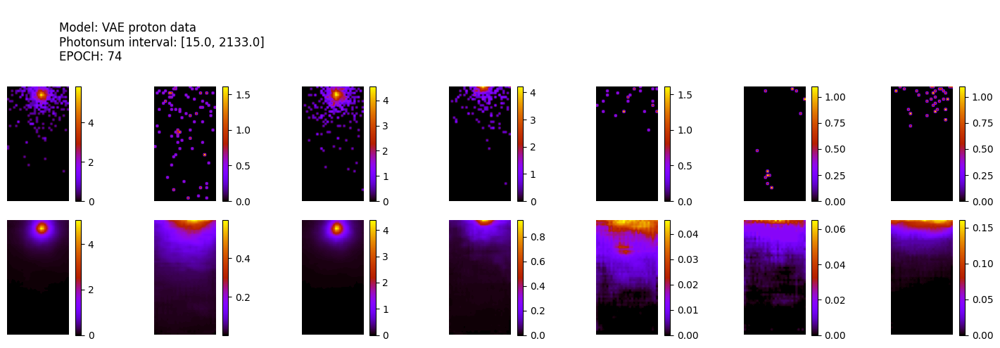

305/305 [==============================] - 1s 4ms/step
ws mean 20.29 ch1 0.02 ch2 6.37 ch3 0.22 ch4 44.31 ch5 50.55 Time for epoch 75 is 28.743635416030884 sec
22900 [Total loss: 39.65] [Recon_loss: 39.09] [KL loss: 0.81]
23000 [Total loss: 31.72] [Recon_loss: 31.36] [KL loss: 0.51]
23100 [Total loss: 34.18] [Recon_loss: 33.77] [KL loss: 0.58]


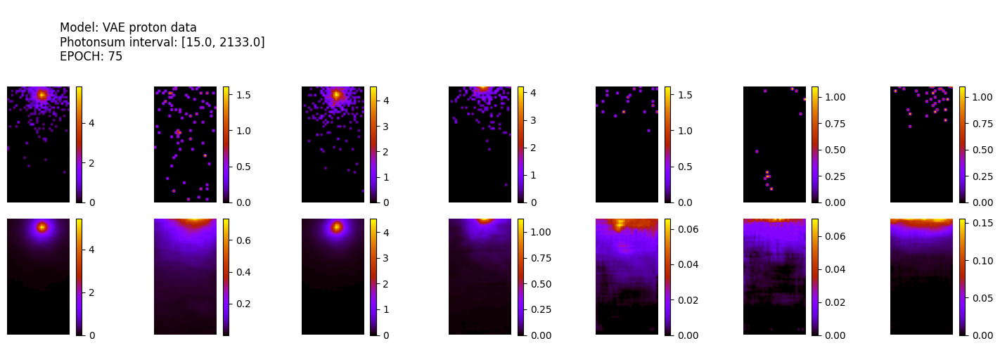

305/305 [==============================] - 1s 4ms/step
ws mean 18.62 ch1 0.02 ch2 5.66 ch3 0.19 ch4 40.80 ch5 46.42 Time for epoch 76 is 29.0063316822052 sec
23200 [Total loss: 47.36] [Recon_loss: 46.68] [KL loss: 0.97]
23300 [Total loss: 38.20] [Recon_loss: 37.84] [KL loss: 0.52]
23400 [Total loss: 38.59] [Recon_loss: 38.11] [KL loss: 0.69]


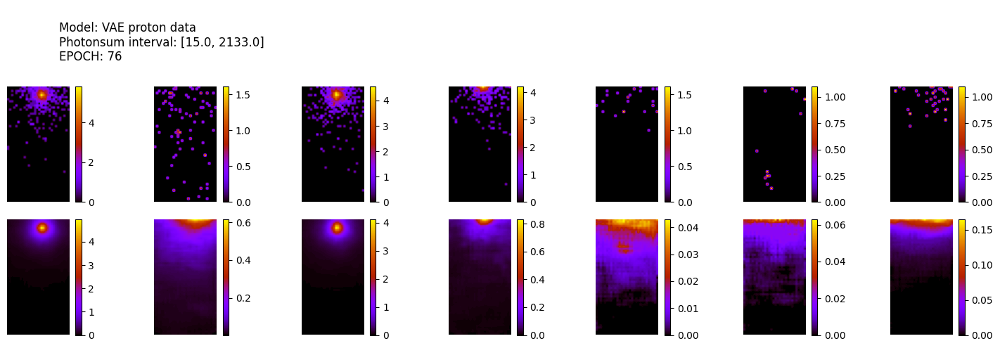

305/305 [==============================] - 1s 4ms/step
ws mean 22.89 ch1 0.02 ch2 6.41 ch3 0.24 ch4 50.74 ch5 57.06 Time for epoch 77 is 28.723291873931885 sec
23500 [Total loss: 47.04] [Recon_loss: 46.41] [KL loss: 0.90]
23600 [Total loss: 32.90] [Recon_loss: 32.61] [KL loss: 0.42]
23700 [Total loss: 42.88] [Recon_loss: 42.23] [KL loss: 0.93]


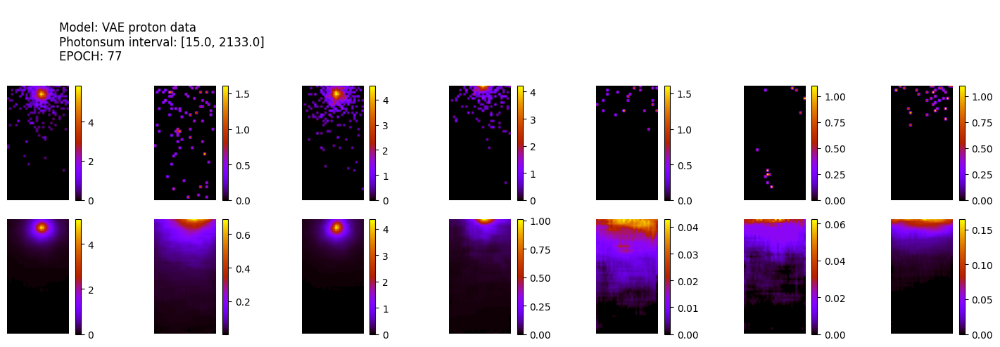

305/305 [==============================] - 1s 4ms/step
ws mean 20.96 ch1 0.02 ch2 6.22 ch3 0.21 ch4 46.20 ch5 52.16 Time for epoch 78 is 28.78957200050354 sec
23800 [Total loss: 37.14] [Recon_loss: 36.59] [KL loss: 0.79]
23900 [Total loss: 43.31] [Recon_loss: 42.75] [KL loss: 0.80]
24000 [Total loss: 45.92] [Recon_loss: 44.95] [KL loss: 1.38]


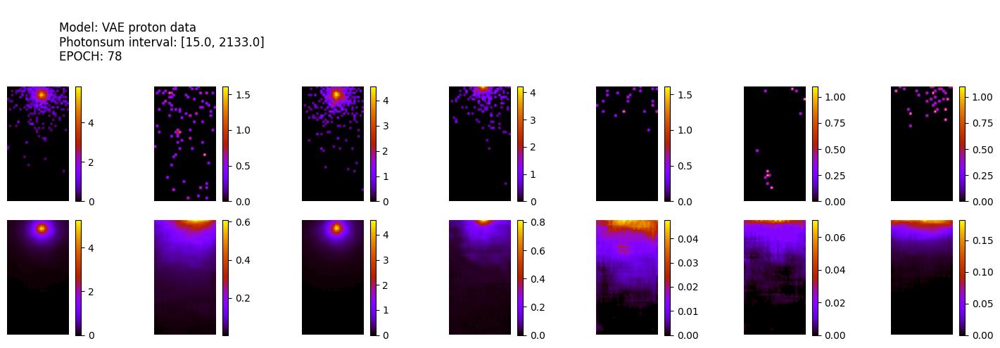

305/305 [==============================] - 1s 4ms/step
ws mean 19.15 ch1 0.02 ch2 5.93 ch3 0.20 ch4 41.94 ch5 47.65 Time for epoch 79 is 28.696614980697632 sec
24100 [Total loss: 41.57] [Recon_loss: 40.82] [KL loss: 1.07]
24200 [Total loss: 33.94] [Recon_loss: 33.55] [KL loss: 0.54]
24300 [Total loss: 46.11] [Recon_loss: 45.46] [KL loss: 0.92]
24400 [Total loss: 48.36] [Recon_loss: 47.52] [KL loss: 1.19]


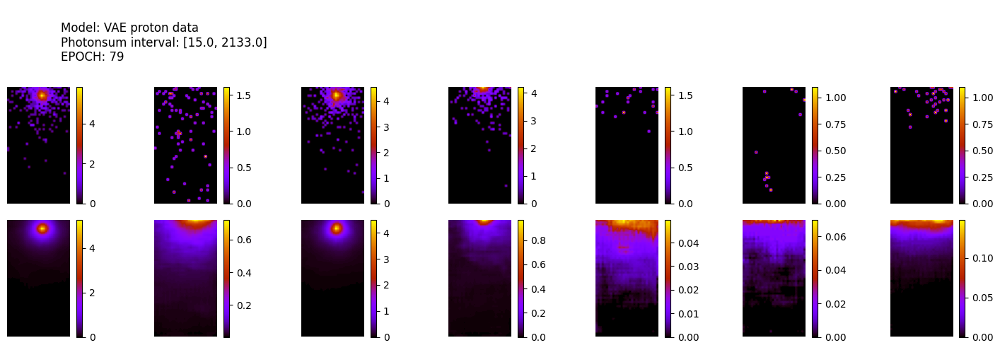

305/305 [==============================] - 1s 4ms/step
ws mean 18.80 ch1 0.02 ch2 5.84 ch3 0.19 ch4 41.13 ch5 46.82 Time for epoch 80 is 28.76340103149414 sec
24500 [Total loss: 35.31] [Recon_loss: 34.90] [KL loss: 0.59]
24600 [Total loss: 44.82] [Recon_loss: 44.12] [KL loss: 0.99]
24700 [Total loss: 39.66] [Recon_loss: 39.12] [KL loss: 0.78]


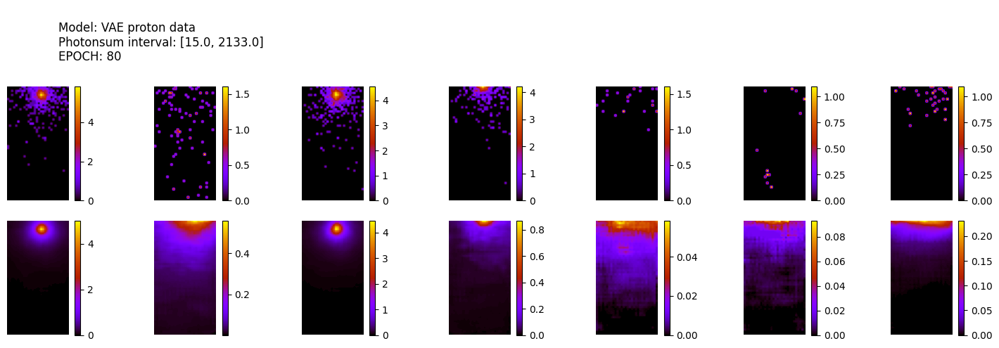

305/305 [==============================] - 1s 4ms/step
ws mean 19.57 ch1 0.02 ch2 5.51 ch3 0.21 ch4 43.44 ch5 48.66 Time for epoch 81 is 29.05124807357788 sec
24800 [Total loss: 36.89] [Recon_loss: 36.38] [KL loss: 0.73]
24900 [Total loss: 43.76] [Recon_loss: 43.16] [KL loss: 0.86]
25000 [Total loss: 43.93] [Recon_loss: 43.26] [KL loss: 0.96]


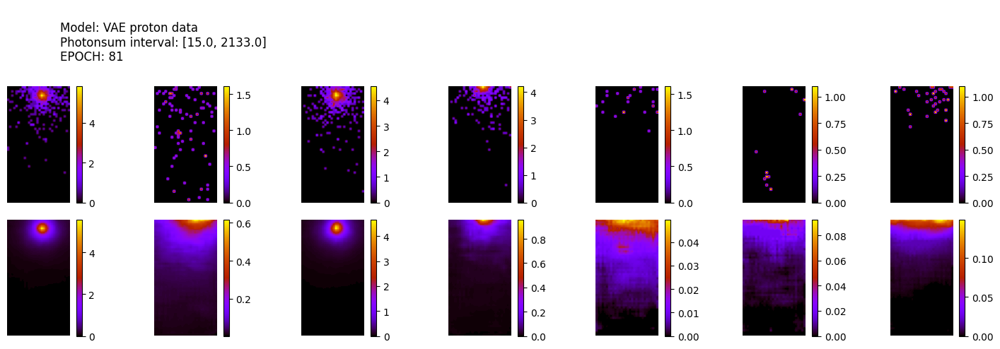

305/305 [==============================] - 1s 4ms/step
ws mean 15.90 ch1 0.02 ch2 5.84 ch3 0.19 ch4 33.84 ch5 39.62 Time for epoch 82 is 28.78112030029297 sec
25100 [Total loss: 37.26] [Recon_loss: 36.76] [KL loss: 0.72]
25200 [Total loss: 26.49] [Recon_loss: 26.29] [KL loss: 0.29]
25300 [Total loss: 45.26] [Recon_loss: 44.73] [KL loss: 0.75]


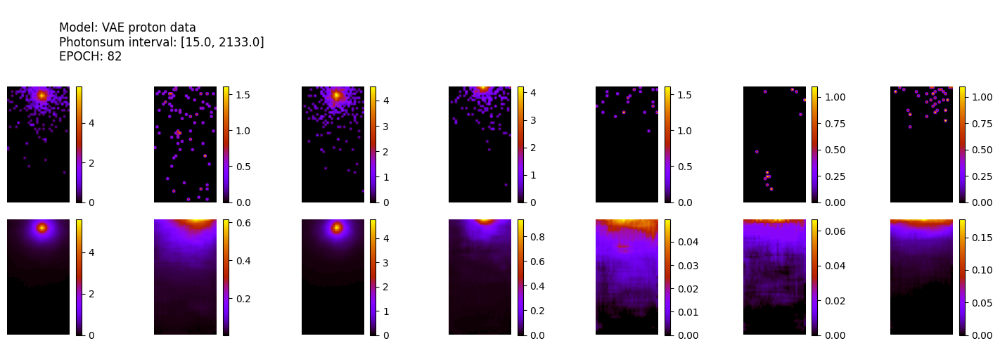

305/305 [==============================] - 1s 4ms/step
ws mean 15.95 ch1 0.02 ch2 5.94 ch3 0.15 ch4 33.95 ch5 39.71 Time for epoch 83 is 28.795944213867188 sec
25400 [Total loss: 42.46] [Recon_loss: 41.83] [KL loss: 0.91]
25500 [Total loss: 44.82] [Recon_loss: 44.10] [KL loss: 1.03]
25600 [Total loss: 42.08] [Recon_loss: 41.50] [KL loss: 0.83]


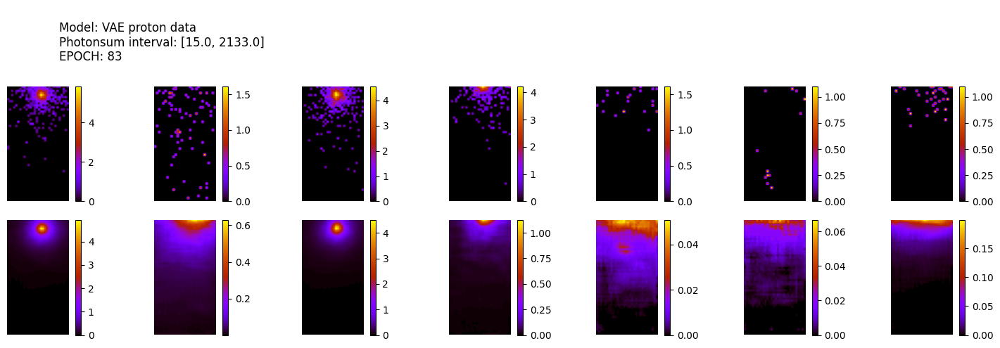

305/305 [==============================] - 1s 4ms/step
ws mean 19.42 ch1 0.02 ch2 5.99 ch3 0.23 ch4 42.51 ch5 48.35 Time for epoch 84 is 29.009358167648315 sec
25700 [Total loss: 32.23] [Recon_loss: 31.96] [KL loss: 0.39]
25800 [Total loss: 43.36] [Recon_loss: 42.75] [KL loss: 0.88]
25900 [Total loss: 42.57] [Recon_loss: 42.04] [KL loss: 0.75]


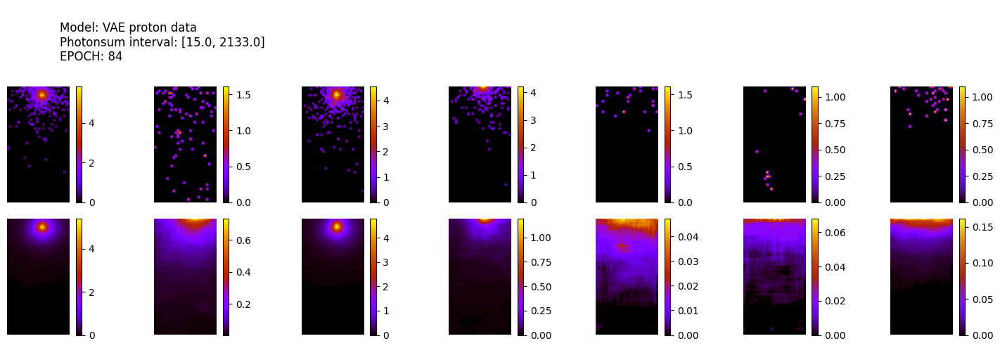

305/305 [==============================] - 1s 4ms/step
ws mean 15.48 ch1 0.02 ch2 6.07 ch3 0.17 ch4 32.59 ch5 38.57 Time for epoch 85 is 28.79621958732605 sec
26000 [Total loss: 41.97] [Recon_loss: 41.42] [KL loss: 0.79]
26100 [Total loss: 31.68] [Recon_loss: 31.29] [KL loss: 0.56]
26200 [Total loss: 44.07] [Recon_loss: 43.53] [KL loss: 0.77]


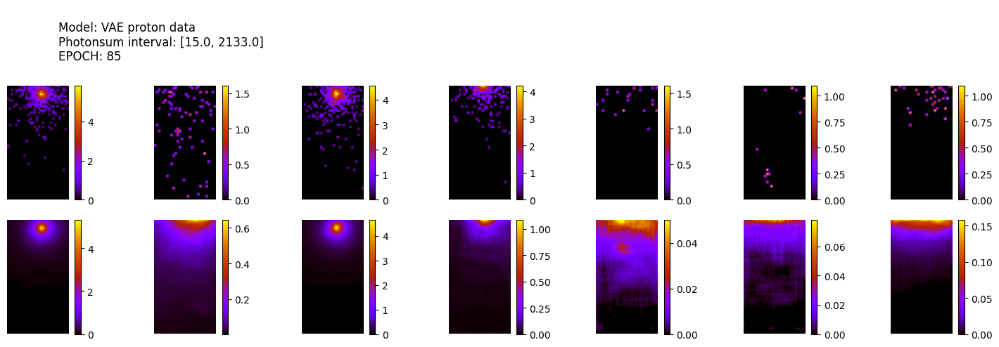

305/305 [==============================] - 1s 4ms/step
ws mean 14.54 ch1 0.02 ch2 5.64 ch3 0.17 ch4 30.63 ch5 36.24 Time for epoch 86 is 28.797568321228027 sec
26300 [Total loss: 37.07] [Recon_loss: 36.69] [KL loss: 0.54]
26400 [Total loss: 35.38] [Recon_loss: 35.06] [KL loss: 0.45]
26500 [Total loss: 42.61] [Recon_loss: 42.05] [KL loss: 0.80]


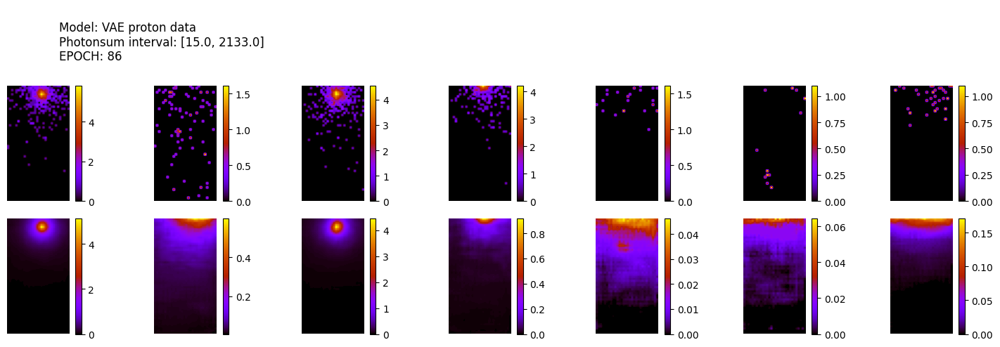

305/305 [==============================] - 1s 4ms/step
ws mean 15.23 ch1 0.02 ch2 5.95 ch3 0.18 ch4 32.06 ch5 37.95 Time for epoch 87 is 28.81715726852417 sec
26600 [Total loss: 43.13] [Recon_loss: 42.53] [KL loss: 0.86]
26700 [Total loss: 44.00] [Recon_loss: 43.17] [KL loss: 1.19]
26800 [Total loss: 43.71] [Recon_loss: 43.05] [KL loss: 0.95]


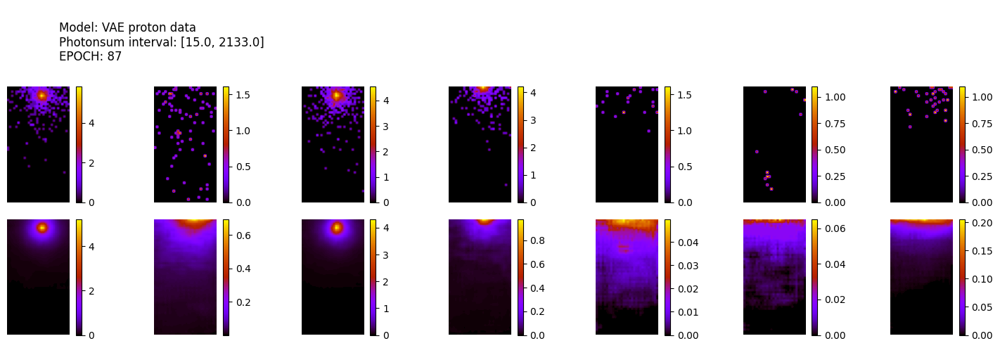

305/305 [==============================] - 1s 4ms/step
ws mean 14.69 ch1 0.02 ch2 5.60 ch3 0.19 ch4 31.07 ch5 36.60 Time for epoch 88 is 28.96945357322693 sec
26900 [Total loss: 46.08] [Recon_loss: 45.45] [KL loss: 0.91]
27000 [Total loss: 37.12] [Recon_loss: 36.72] [KL loss: 0.57]
27100 [Total loss: 43.58] [Recon_loss: 43.07] [KL loss: 0.72]


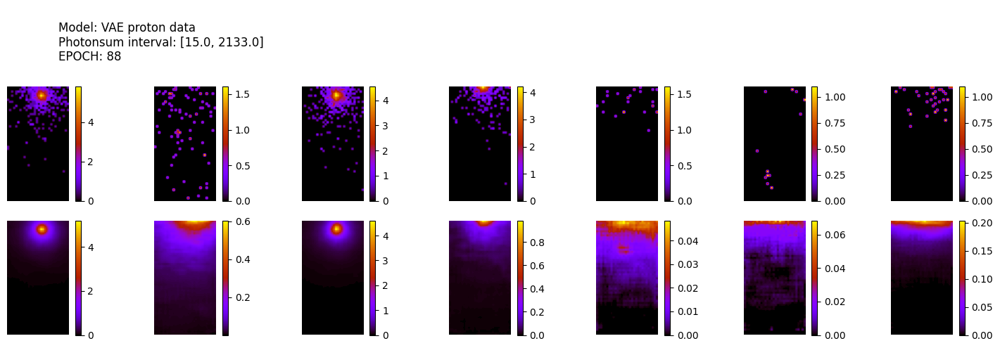

305/305 [==============================] - 1s 4ms/step
ws mean 16.20 ch1 0.02 ch2 5.77 ch3 0.19 ch4 34.65 ch5 40.36 Time for epoch 89 is 28.795267343521118 sec
27200 [Total loss: 40.92] [Recon_loss: 40.45] [KL loss: 0.66]
28600 [Total loss: 36.87] [Recon_loss: 36.53] [KL loss: 0.49]


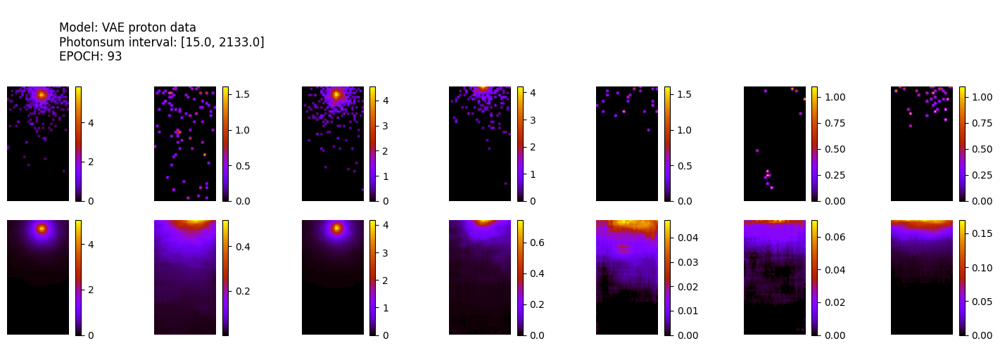

305/305 [==============================] - 1s 4ms/step
ws mean 20.25 ch1 0.02 ch2 6.25 ch3 0.19 ch4 44.25 ch5 50.56 Time for epoch 94 is 28.75918483734131 sec
28700 [Total loss: 42.84] [Recon_loss: 42.38] [KL loss: 0.66]
28800 [Total loss: 44.01] [Recon_loss: 43.22] [KL loss: 1.12]
28900 [Total loss: 35.43] [Recon_loss: 35.17] [KL loss: 0.38]


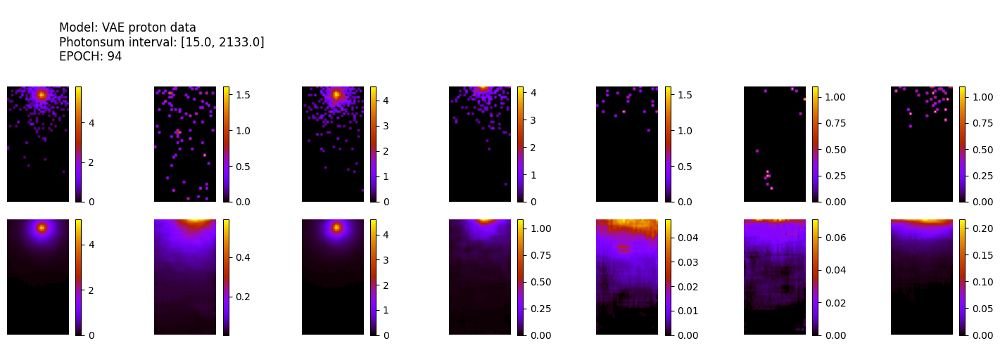

305/305 [==============================] - 1s 4ms/step
ws mean 17.24 ch1 0.02 ch2 5.91 ch3 0.20 ch4 37.14 ch5 42.92 Time for epoch 95 is 29.038275957107544 sec
29000 [Total loss: 44.87] [Recon_loss: 44.27] [KL loss: 0.85]
29100 [Total loss: 30.39] [Recon_loss: 30.00] [KL loss: 0.56]
29200 [Total loss: 41.06] [Recon_loss: 40.52] [KL loss: 0.76]


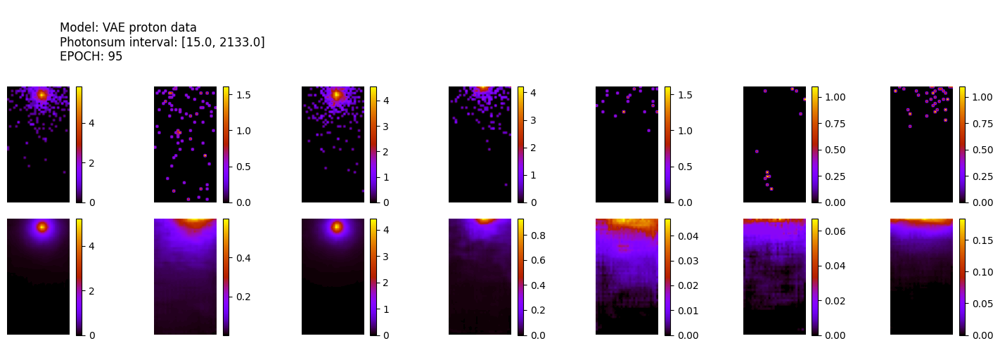

305/305 [==============================] - 1s 4ms/step
ws mean 15.19 ch1 0.02 ch2 5.90 ch3 0.21 ch4 31.90 ch5 37.91 Time for epoch 96 is 28.788557767868042 sec
29300 [Total loss: 37.05] [Recon_loss: 36.50] [KL loss: 0.80]
29400 [Total loss: 35.29] [Recon_loss: 35.01] [KL loss: 0.40]
29500 [Total loss: 41.86] [Recon_loss: 41.33] [KL loss: 0.76]


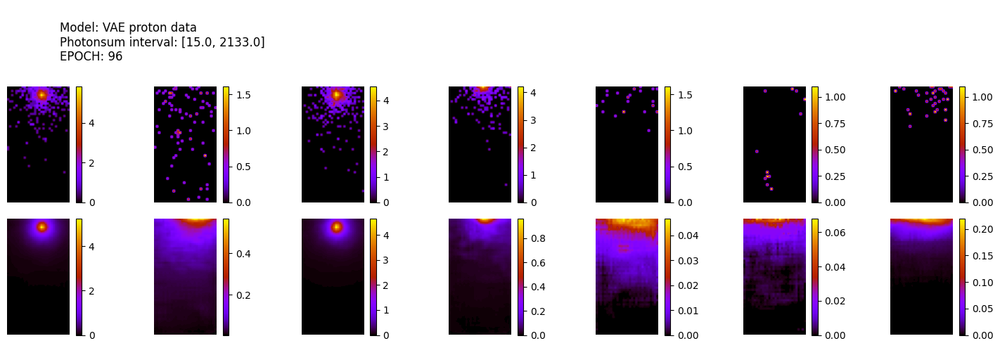

305/305 [==============================] - 1s 4ms/step
ws mean 16.89 ch1 0.02 ch2 6.22 ch3 0.16 ch4 35.97 ch5 42.09 Time for epoch 97 is 28.721495866775513 sec
29600 [Total loss: 37.81] [Recon_loss: 37.45] [KL loss: 0.52]
29700 [Total loss: 37.61] [Recon_loss: 37.10] [KL loss: 0.73]
29800 [Total loss: 41.62] [Recon_loss: 41.17] [KL loss: 0.65]


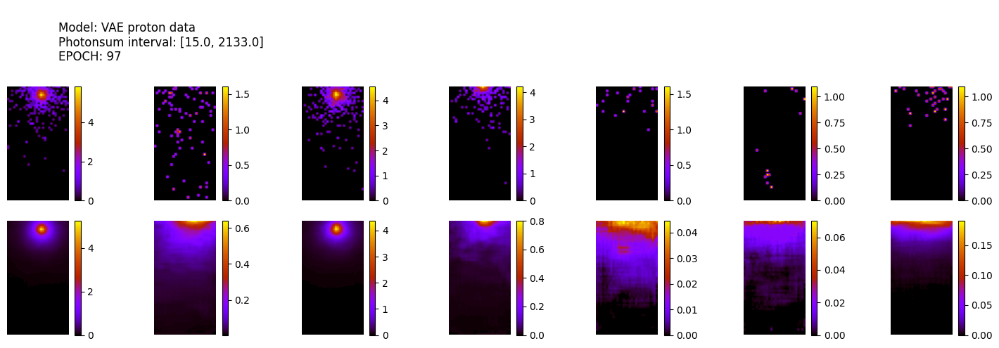

305/305 [==============================] - 1s 4ms/step
ws mean 15.52 ch1 0.02 ch2 5.80 ch3 0.17 ch4 32.83 ch5 38.80 Time for epoch 98 is 29.02685022354126 sec
29900 [Total loss: 43.13] [Recon_loss: 42.59] [KL loss: 0.77]
30000 [Total loss: 39.64] [Recon_loss: 39.19] [KL loss: 0.65]
30100 [Total loss: 43.05] [Recon_loss: 42.54] [KL loss: 0.73]


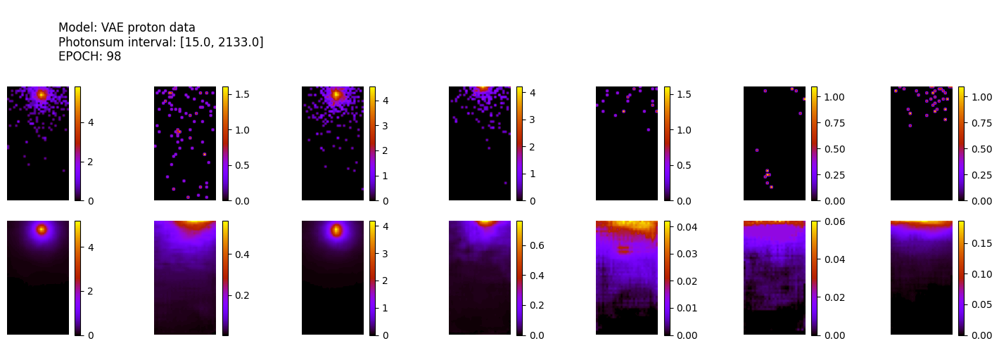

305/305 [==============================] - 1s 4ms/step
ws mean 14.87 ch1 0.02 ch2 5.72 ch3 0.19 ch4 31.26 ch5 37.17 Time for epoch 99 is 28.798341512680054 sec
30200 [Total loss: 33.39] [Recon_loss: 33.13] [KL loss: 0.36]
30300 [Total loss: 32.29] [Recon_loss: 32.04] [KL loss: 0.37]
30400 [Total loss: 42.76] [Recon_loss: 42.14] [KL loss: 0.88]
30500 [Total loss: 38.91] [Recon_loss: 38.52] [KL loss: 0.57]


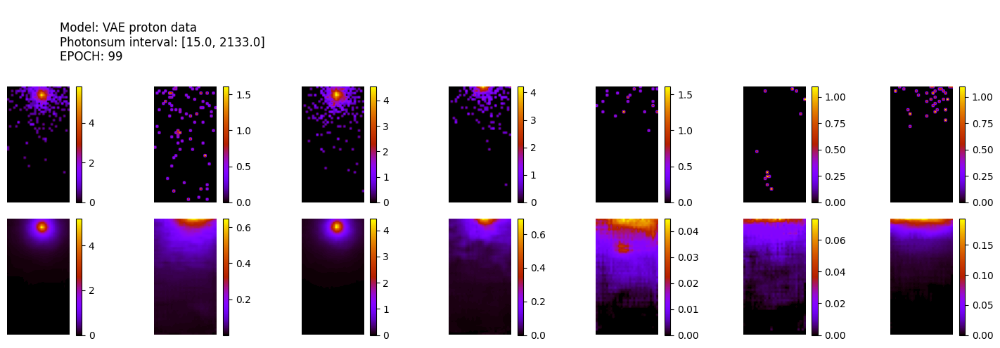

305/305 [==============================] - 1s 4ms/step
ws mean 16.71 ch1 0.02 ch2 5.92 ch3 0.19 ch4 35.87 ch5 41.54 Time for epoch 100 is 29.085207223892212 sec


In [ ]:
history=train(dataset_with_cond, EPOCHS)

## Visualize losses

In [22]:
import seaborn as sns

sns.set_context('notebook', font_scale = 1)

In [23]:
# total_loss, reconstruction_loss, kl_loss
history_losses = np.array([[float(loss) for loss in losses] for losses in history])

In [24]:
total_loss = history_losses[:,0]
reconstruction_loss = history_losses[:,1]
kl_loss = history_losses[:,2]

In [25]:
a4_dims = (14, 5)
def print_loss(loss_values, loss_str):
    fig, ax = plt.subplots(figsize=a4_dims)
    sns.lineplot(loss_values)
    plt.xscale('log')
    plt.yscale('log')
    ax.set_title(f"{loss_str} loss in each epoch")
    ax.set_xlabel("Epoch number")
    ax.set_ylabel(f"{loss_str} loss value")
    plt.savefig(os.path.join(filepath_img, f"{loss_str}_loss"))

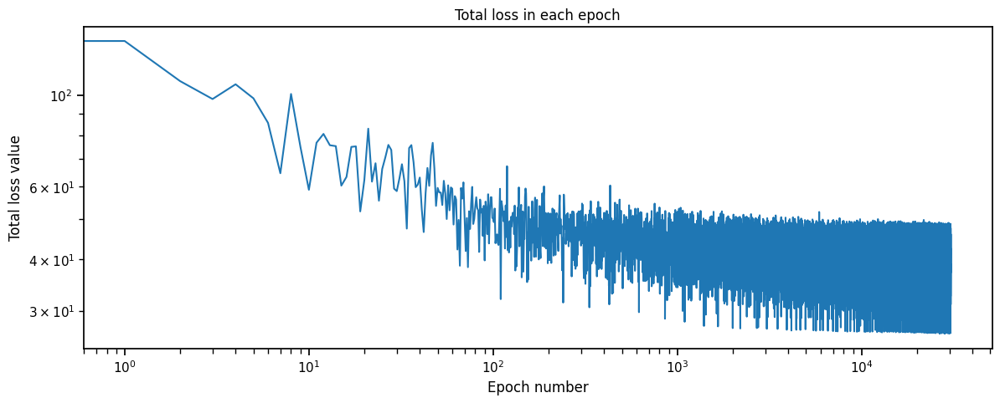

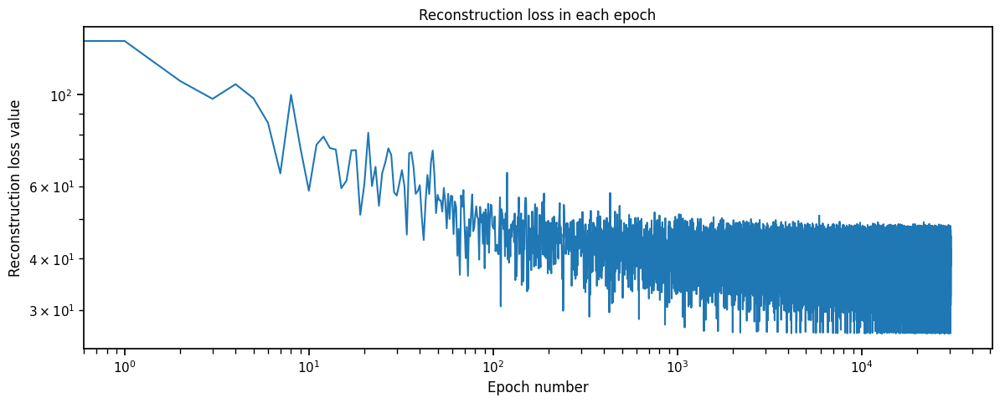

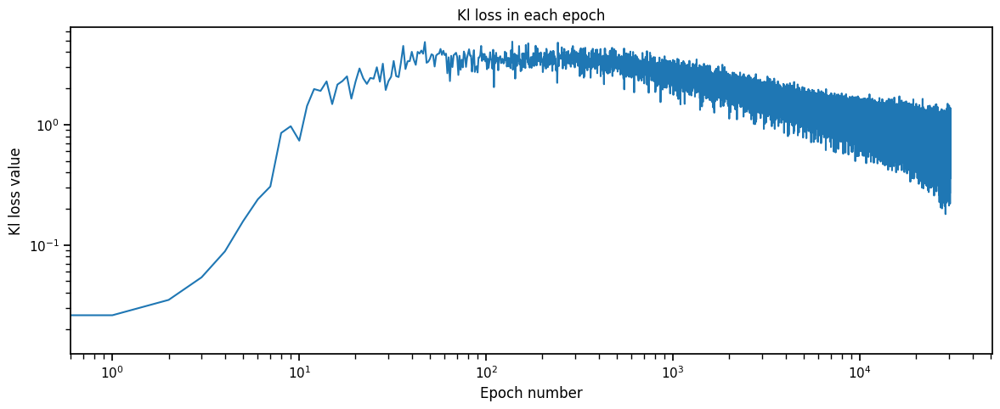

In [26]:
print_loss(total_loss, "Total")
print_loss(reconstruction_loss, "Reconstruction")
print_loss(kl_loss, "Kl")